<a href="https://colab.research.google.com/github/Kamunyamike/Alx_DjangoLearnLab/blob/main/Cervical_Cancer_neural_net.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import kagglehub
path = kagglehub.dataset_download("blank1508/mendeley-lbc-cervical-cancer")

100%|██████████| 2.06G/2.06G [00:20<00:00, 109MB/s]

Extracting files...


In [ ]:
import torch
import numpy as np
import random
import os

# Install required libraries
!pip install torch torchvision torchaudio timm scikit-learn matplotlib seaborn albumentations opencv-python grad-cam -qq

# Check for CUDA availability and print device info
if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"CUDA is available. Using GPU: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")
    print("CUDA is not available. Using CPU.")

# Set a global random seed for reproducibility
def set_seed(seed):
    torch.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)

SEED = 42
set_seed(SEED)
print(f"Global random seed set to {SEED}.")

CUDA is available. Using GPU: Tesla T4
Global random seed set to 42.


### Configuration and Dataset Verification
This cell sets up essential configuration parameters for the model training, such as image size, batch size, learning rate, and training epochs. It also defines the class names for the cervical cancer dataset.

Additionally, it includes a utility function, `verify_class_counts`, to check the distribution of images across different classes in the dataset. This helps in understanding the dataset balance and ensuring that all class directories are correctly identified and populated.

In [ ]:
import os
import pandas as pd
import kagglehub

# Configuration parameters
# It should point to the root directory containing the class subfolders.
path = kagglehub.dataset_download("blank1508/mendeley-lbc-cervical-cancer")
ROOT_DIR = path
IMAGE_SIZE = 224
BATCH_SIZE = 32
NUM_WORKERS = 2
LR = 3e-4
EPOCHS = 20

CLASS_NAMES = [
    'Negative for Intraepithelial malignancy',
    'Low squamous intra-epithelial lesion',
    'High squamous intra-epithelial lesion',
    'Squamous cell carcinoma'
]

def verify_class_counts(root_dir, class_names):
    """
    Verifies and prints the count of images for each class in the dataset.

    Args:
        root_dir (str): The root directory of the dataset containing class subfolders.
        class_names (list): A list of class names, corresponding to subfolder names.
    """
    counts = {}
    total_images = 0
    for class_name in class_names:
        class_path = os.path.join(root_dir, class_name)
        if not os.path.exists(class_path):
            print(f"Warning: Directory for class '{class_name}' not found at {class_path}")
            counts[class_name] = 0
            continue
        # Count image files (assuming common image extensions)
        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff'))]
        count = len(image_files)
        counts[class_name] = count
        total_images += count

    # Create a summary DataFrame
    summary_df = pd.DataFrame(counts.items(), columns=['Class', 'Count'])
    summary_df.loc['Total'] = ['Total', total_images] # Add total row
    print("Class Distribution Summary:")
    display(summary_df)

# Call the function to verify counts immediately after defining the configuration
verify_class_counts(ROOT_DIR, CLASS_NAMES)

Using Colab cache for faster access to the 'mendeley-lbc-cervical-cancer' dataset.
Class Distribution Summary:


,Class,Count
0,Negative for Intraepithelial malignancy,612
1,Low squamous intra-epithelial lesion,113
2,High squamous intra-epithelial lesion,163
3,Squamous cell carcinoma,74
Total,Total,962


### Data Splitting Function
This cell defines a function, `create_stratified_splits`, that handles the data splitting process. It first scans the `ROOT_DIR` to create a DataFrame of all image paths and their corresponding labels. Then, it performs a stratified 70/15/15 split into training, validation, and testing sets, ensuring that the class distribution is maintained across all splits. Finally, it saves these splits as CSV files and prints a summary of per-class counts for each set.

In [ ]:
from sklearn.model_selection import train_test_split
import pandas as pd
import os

def create_stratified_splits(root_dir, class_names, test_size=0.15, val_size=0.15, seed=42):
    """
    Recursively scans ROOT_DIR, builds a dataframe of file paths and labels,
    performs stratified splits into train/val/test, and saves CSVs.

    Args:
        root_dir (str): The root directory of the dataset.
        class_names (list): List of class names (subfolder names).
        test_size (float): Proportion of the dataset to include in the test split.
        val_size (float): Proportion of the dataset to include in the validation split.
        seed (int): Random seed for reproducibility.
    """

    print("Building dataset DataFrame...")
    data = []
    for class_name in class_names:
        class_path = os.path.join(root_dir, class_name)
        if os.path.exists(class_path):
            for img_name in os.listdir(class_path):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff')):
                    data.append({
                        'filepath': os.path.join(class_path, img_name),
                        'label': class_name
                    })
    df = pd.DataFrame(data)
    print(f"Total images found: {len(df)}")

    if df.empty:
        print("No images found. Cannot create splits.")
        return

    # Calculate sizes for train/val/test from total size
    # First split: (train + val) vs test
    train_val_df, test_df = train_test_split(
        df, test_size=test_size, stratify=df['label'], random_state=seed
    )

    # Second split: train vs val from train_val_df
    # Adjust val_size to be relative to train_val_df
    adjusted_val_size = val_size / (1 - test_size)
    train_df, val_df = train_test_split(
        train_val_df, test_size=adjusted_val_size, stratify=train_val_df['label'], random_state=seed
    )

    # Create splits directory if it doesn't exist
    splits_dir = './splits'
    os.makedirs(splits_dir, exist_ok=True)

    # Save to CSVs
    train_df.to_csv(os.path.join(splits_dir, 'train.csv'), index=False)
    val_df.to_csv(os.path.join(splits_dir, 'val.csv'), index=False)
    test_df.to_csv(os.path.join(splits_dir, 'test.csv'), index=False)
    print(f"Splits saved to {splits_dir}/")

    # Print per-class counts for each split
    print("\nPer-class counts for each split:")
    print("\nTrain Split:")
    display(train_df['label'].value_counts().reset_index(name='Count'))
    print("\nValidation Split:")
    display(val_df['label'].value_counts().reset_index(name='Count'))
    print("\nTest Split:")
    display(test_df['label'].value_counts().reset_index(name='Count'))

# Call the function to create and save the splits
create_stratified_splits(ROOT_DIR, CLASS_NAMES, seed=SEED)


Building dataset DataFrame...
Total images found: 962
Splits saved to ./splits/

Per-class counts for each split:

Train Split:


,label,Count
0,Negative for Intraepithelial malignancy,428
1,High squamous intra-epithelial lesion,113
2,Low squamous intra-epithelial lesion,79
3,Squamous cell carcinoma,52



Validation Split:


,label,Count
0,Negative for Intraepithelial malignancy,92
1,High squamous intra-epithelial lesion,25
2,Low squamous intra-epithelial lesion,17
3,Squamous cell carcinoma,11



Test Split:


,label,Count
0,Negative for Intraepithelial malignancy,92
1,High squamous intra-epithelial lesion,25
2,Low squamous intra-epithelial lesion,17
3,Squamous cell carcinoma,11


### PyTorch Dataset and DataLoader Setup
This section defines the PyTorch `Dataset` and `DataLoader` for our cervical cancer image classification task. It uses `albumentations` for efficient image transformations and `opencv-python` (`cv2`) for image loading.

Key components:
-   **Custom Dataset Class (`CervicalCancerDataset`)**: Inherits from `torch.utils.data.Dataset`. It reads image file paths and labels from the CSVs generated in the previous step.
-   **Image Transformations (`A.Compose`)**: Defined separately for training, validation, and testing.
    -   **Training Transformations**: Include resizing, random rotations/flips, shift-scale-rotate, brightness/contrast adjustments, slight blurring, and normalization using ImageNet mean and standard deviation.
    -   **Validation/Test Transformations**: Include resizing, optional center-cropping (though for `IMAGE_SIZE=224` and direct resize, center crop might be redundant depending on aspect ratio, direct resize is typically sufficient for consistent input), and normalization.
-   **Data Loading**: Images are read using `cv2.imread`, converted to RGB, and then passed through the defined Albumentations transforms.
-   **Batching**: `DataLoader` instances are created for training, validation, and test sets, configured with `BATCH_SIZE` and `NUM_WORKERS` to efficiently load data into mini-batches.

Finally, the code demonstrates how to inspect the shape of a single batch from the DataLoader and visualizes a few augmented samples from the training set to verify the transformations.

Train Dataset size: 672
Validation Dataset size: 145
Test Dataset size: 145

--- Sample Batch Shape ---


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Images batch shape: torch.Size([32, 3, 224, 224])
Labels batch shape: torch.Size([32])

--- Sample Augmented Images from Train Loader ---


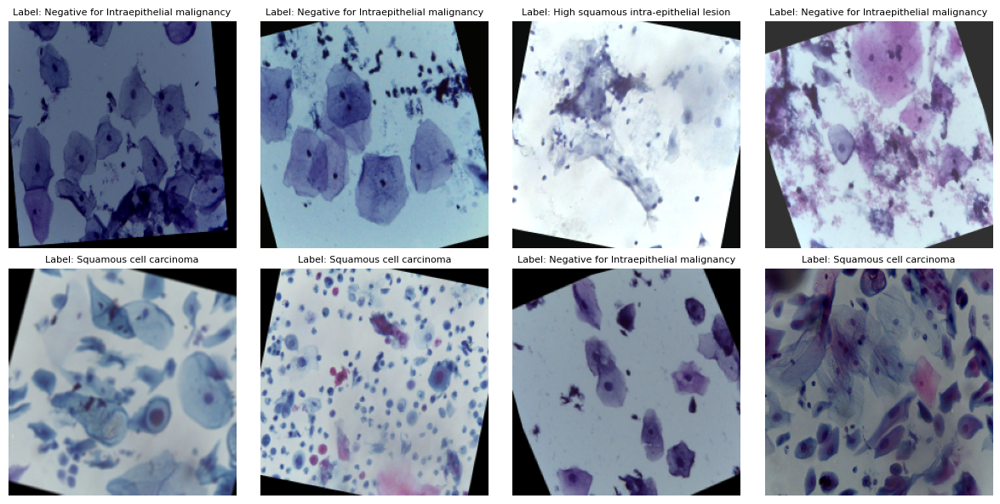

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define the custom Dataset class
class CervicalCancerDataset(Dataset):
    def __init__(self, csv_file, class_to_idx, transform=None):
        self.df = pd.read_csv(csv_file)
        self.class_to_idx = class_to_idx
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.loc[idx, 'filepath']
        label_name = self.df.loc[idx, 'label']
        label = self.class_to_idx[label_name]

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert BGR to RGB

        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']

        return image, label

# Map class names to integers
class_to_idx = {name: i for i, name in enumerate(CLASS_NAMES)}

# Define Albumentations transforms
train_transforms = A.Compose([
    A.Resize(IMAGE_SIZE, IMAGE_SIZE),
    A.Rotate(limit=20, p=0.7), # Random rotation up to 20 degrees
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=20, p=0.7, border_mode=cv2.BORDER_CONSTANT),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.7),
    A.Blur(blur_limit=3, p=0.3), # Slight blur
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), # ImageNet mean and std
    ToTensorV2(),
])

val_test_transforms = A.Compose([
    A.Resize(IMAGE_SIZE, IMAGE_SIZE),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), # ImageNet mean and std
    ToTensorV2(),
])

# Create Dataset instances
train_dataset = CervicalCancerDataset(
    csv_file='./splits/train.csv',
    class_to_idx=class_to_idx,
    transform=train_transforms
)
val_dataset = CervicalCancerDataset(
    csv_file='./splits/val.csv',
    class_to_idx=class_to_idx,
    transform=val_test_transforms
)
test_dataset = CervicalCancerDataset(
    csv_file='./splits/test.csv',
    class_to_idx=class_to_idx,
    transform=val_test_transforms
)

# Create DataLoader instances
train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)

print(f"Train Dataset size: {len(train_dataset)}")
print(f"Validation Dataset size: {len(val_dataset)}")
print(f"Test Dataset size: {len(test_dataset)}")

# Print one batch shape
print("\n--- Sample Batch Shape ---")
for images, labels in train_loader:
    print(f"Images batch shape: {images.shape}") # Should be (BATCH_SIZE, C, H, W)
    print(f"Labels batch shape: {labels.shape}") # Should be (BATCH_SIZE)
    break # Only get the first batch

# Display a small grid of augmented samples with labels
print("\n--- Sample Augmented Images from Train Loader ---")
# Helper function to denormalize for visualization
def denormalize(tensor, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
    tensor = tensor.clone().detach().cpu()
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor

# Reverse class_to_idx for visualization
idx_to_class = {v: k for k, v in class_to_idx.items()}

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
for i, (images, labels) in enumerate(train_loader):
    for j in range(min(BATCH_SIZE, 8)): # Display up to 8 images
        ax = axes[j // 4, j % 4]
        img = denormalize(images[j]).permute(1, 2, 0).numpy() # Convert from (C, H, W) to (H, W, C) for matplotlib
        ax.imshow(img)
        ax.set_title(f"Label: {idx_to_class[labels[j].item()]}", fontsize=8)
        ax.axis('off')
    break
plt.tight_layout()
plt.show()

### Model, Optimizer, Scheduler, and Class Weights Setup
This cell defines a function, `get_model_optimizer_scheduler_weights`, which encapsulates the setup for our image classification model, its optimizer, learning rate scheduler, and computes class weights for handling dataset imbalance. It leverages the `timm` library for pre-trained EfficientNet-B0, adapting its final layer for our 4-class problem.

Key features:
-   **Model Architecture**: Uses `EfficientNet-B0` from `timm` with pre-trained weights for faster convergence and better performance.
-   **Custom Classifier Head**: The original classification head is replaced with a new linear layer tailored to our `NUM_CLASSES`.
-   **Backbone Freezing**: Provides an option to initially freeze the backbone layers, allowing only the new head to train, which can be beneficial in early training stages.
-   **Mixed Precision Training**: Incorporates `torch.cuda.amp` for mixed-precision training, enhancing training speed and reducing memory usage on compatible GPUs.
-   **Optimizer**: Uses `AdamW`, a robust optimizer often preferred for deep learning tasks.
-   **Learning Rate Scheduler**: Implements `CosineAnnealingLR` to dynamically adjust the learning rate during training, helping to find better minima.
-   **Class Weights**: Computes inverse frequency class weights from the training dataset, which can be used with `CrossEntropyLoss` to mitigate the impact of class imbalance during training.

This setup provides a solid foundation for training a high-performance image classification model.

In [ ]:
import timm
import torch
import torch.nn as nn
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from sklearn.utils import class_weight
import numpy as np

NUM_CLASSES = len(CLASS_NAMES)

def get_model_optimizer_scheduler_weights(
    model_name='efficientnet_b0',
    pretrained=True,
    num_classes=NUM_CLASSES,
    lr=LR,
    epochs=EPOCHS,
    freeze_backbone=False,
    train_dataset_labels=None # Pass actual labels from the training dataset
):
    """
    Defines the model, optimizer, scheduler, and computes class weights.

    Args:
        model_name (str): Name of the timm model to use (e.g., 'efficientnet_b0', 'resnet18').
        pretrained (bool): Whether to use pretrained weights.
        num_classes (int): Number of output classes.
        lr (float): Learning rate for the optimizer.
        epochs (int): Number of training epochs (for scheduler).
        freeze_backbone (bool): If True, freezes the backbone layers initially.
        train_dataset_labels (list or np.array): Labels from the training dataset to compute class weights.

    Returns:
        tuple: (model, optimizer, scheduler, class_weights)
    """

    # 1. Model Definition
    print(f"Initializing model: {model_name} with pretrained={pretrained}")
    model = timm.create_model(model_name, pretrained=pretrained, num_classes=num_classes)
    model.to(device)

    # 2. Freeze/Unfreeze Backbone
    if freeze_backbone:
        print("Freezing backbone layers.")
        for name, param in model.named_parameters():
            if 'classifier' not in name and 'head' not in name: # Adjust based on model's head layer name
                param.requires_grad = False

    # Define parameters to optimize (only unfrozen ones)
    optimizer_params = filter(lambda p: p.requires_grad, model.parameters())

    # 3. Optimizer
    print(f"Initializing AdamW optimizer with LR: {lr}")
    optimizer = AdamW(optimizer_params, lr=lr)

    # 4. Scheduler
    print(f"Initializing CosineAnnealingLR scheduler for {epochs} epochs")
    scheduler = CosineAnnealingLR(optimizer, T_max=epochs)

    # 5. Class Weights from Training Set
    computed_class_weights = None
    if train_dataset_labels is not None and len(train_dataset_labels) > 0:
        print("Computing class weights for imbalanced loss.")
        unique_classes = np.sort(np.unique(train_dataset_labels))
        computed_class_weights = class_weight.compute_class_weight(
            class_weight='balanced',
            classes=unique_classes,
            y=train_dataset_labels
        )
        computed_class_weights = torch.tensor(computed_class_weights, dtype=torch.float).to(device)
        print("Computed Class Weights:", computed_class_weights.cpu().numpy())
    else:
        print("Train dataset labels not provided or empty, skipping class weight computation.")

    return model, optimizer, scheduler, computed_class_weights

# Get labels from the training dataset for class weight computation
train_labels = train_dataset.df['label'].apply(lambda x: class_to_idx[x]).tolist()

# Initialize model, optimizer, scheduler, and class weights
model, optimizer, scheduler, class_weights = get_model_optimizer_scheduler_weights(
    model_name='efficientnet_b0',
    pretrained=True,
    num_classes=NUM_CLASSES,
    lr=LR,
    epochs=EPOCHS,
    freeze_backbone=False, # Set to True if you want to freeze for initial epochs
    train_dataset_labels=train_labels
)

print("\nModel, Optimizer, Scheduler, and Class Weights prepared successfully.")


Initializing model: efficientnet_b0 with pretrained=True


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

Initializing AdamW optimizer with LR: 0.0003
Initializing CosineAnnealingLR scheduler for 20 epochs
Computing class weights for imbalanced loss.
Computed Class Weights: [0.39252338 2.1265824  1.4867257  3.2307692 ]

Model, Optimizer, Scheduler, and Class Weights prepared successfully.


# Task
Train an image classification model using EfficientNet-B0 on the "mendeley-lbc-cervical-cancer" dataset for 20 epochs. The training process should include a `train_one_epoch` function that handles forward/backward passes, calculates Cross-Entropy Loss with class weights, and tracks accuracy and F1-score, incorporating mixed-precision training with `torch.cuda.amp.GradScaler`. Implement a `validate_one_epoch` function to perform forward passes, calculate loss, and track accuracy and F1-score on the validation set. The main training loop should iterate for 20 epochs, calling these functions, tracking the best validation F1-macro score, and saving the best model checkpoint to `./checkpoints/best_model.pt` with early stopping patience of 5. Log progress using `tqdm` and print a concise metrics table per epoch. After training, plot the training and validation loss and accuracy curves using `matplotlib`. Finally, summarize the training process, the best validation F1-macro achieved, and the epoch at which the best model was saved.

## Define Training Function

### Subtask:
Create a function `train_one_epoch` that handles a single training epoch. It will perform forward and backward passes, calculate loss (using class weights for Cross-Entropy Loss), track metrics (accuracy, F1-score), and use `torch.cuda.amp.GradScaler` for mixed-precision training. The function should take `model`, `dataloader`, `optimizer`, `criterion`, `scaler`, `device` as input and return average loss and metrics for the epoch.


**Reasoning**:
I need to define the `train_one_epoch` function as specified in the instructions, including imports, model setup, loss calculation, backpropagation, and metric tracking.



In [ ]:
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score
import torch.cuda.amp as amp
import numpy as np

def train_one_epoch(model, dataloader, optimizer, criterion, scaler, device):
    """
    Handles a single training epoch.

    Args:
        model (torch.nn.Module): The model to train.
        dataloader (torch.utils.data.DataLoader): DataLoader for the training data.
        optimizer (torch.optim.Optimizer): Optimizer for model parameters.
        criterion (torch.nn.Module): Loss function.
        scaler (torch.cuda.amp.GradScaler): Gradient scaler for mixed-precision training.
        device (torch.device): The device (CPU or GPU) to run the training on.

    Returns:
        tuple: Average loss, accuracy, and F1-macro score for the epoch.
    """
    model.train()  # Set the model to training mode
    running_loss = []
    all_labels = []
    all_preds = []

    # Iterate through the dataloader with a progress bar
    for batch_idx, (images, labels) in tqdm(enumerate(dataloader), desc='Training', total=len(dataloader)):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()  # Zero the gradients

        # Use autocast for mixed-precision training
        with amp.autocast():
            outputs = model(images)  # Forward pass
            loss = criterion(outputs, labels)  # Calculate loss

        scaler.scale(loss).backward()  # Scale loss and perform backward pass
        scaler.step(optimizer)  # Update model parameters
        scaler.update()  # Update the scaler for the next iteration

        running_loss.append(loss.item())

        # Convert outputs to predicted class labels
        _, predicted = torch.max(outputs.data, 1)
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())

    avg_loss = np.mean(running_loss)
    accuracy = accuracy_score(all_labels, all_preds)
    f1_macro = f1_score(all_labels, all_preds, average='macro')

    return avg_loss, accuracy, f1_macro

print("train_one_epoch function defined successfully.")

train_one_epoch function defined successfully.


## Define Validation Function

### Subtask:
Create a function `validate_one_epoch` that handles a single validation epoch. It will perform forward passes, calculate loss (using class weights for Cross-Entropy Loss if applicable, though typically only for training), and track metrics (accuracy, F1-score) on the validation set. The function should take `model`, `dataloader`, `criterion`, `device` as input and return average loss and metrics for the epoch.

#### Instructions
1. Define a function `validate_one_epoch` that accepts `model`, `dataloader`, `criterion`, `device` as arguments.
2. Set the `model` to evaluation mode using `model.eval()`.
3. Initialize empty lists to store `running_loss`, `all_labels`, and `all_preds` for the epoch.
4. Disable gradient calculations using `torch.no_grad()` context manager.
5. Iterate through the `dataloader` using `tqdm`, providing a description like 'Validation' and displaying the total number of batches.
6. For each batch, move images and labels to the specified `device`.
7. Perform a forward pass to get model `outputs`.
8. Calculate the `loss` using the provided `criterion` and `outputs` and `labels`.
9. Store the current `loss.item()` to `running_loss`.
10. Convert model `outputs` to predicted class labels (e.g., using `torch.argmax`) and move them to CPU. Store `labels.cpu()` and `preds.cpu()` to `all_labels` and `all_preds`, respectively.
11. After iterating through all batches, calculate the `avg_loss` for the epoch.
12. Compute the `accuracy` and `f1_macro` score using `accuracy_score` and `f1_score` (with `average='macro'`) from `sklearn.metrics` based on `all_labels` and `all_preds`.
13. Return the `avg_loss`, `accuracy`, and `f1_macro`.

**Reasoning**:
I need to implement the `validate_one_epoch` function as described in the previous markdown block, which involves setting the model to evaluation mode, disabling gradient calculations, iterating through the validation dataloader, calculating loss and metrics, and returning the results.



In [ ]:
from tqdm import tqdm
from sklearn.metrics import accuracy_score, f1_score
import numpy as np
import torch

def validate_one_epoch(model, dataloader, criterion, device):
    """
    Handles a single validation epoch.

    Args:
        model (torch.nn.Module): The model to validate.
        dataloader (torch.utils.data.DataLoader): DataLoader for the validation data.
        criterion (torch.nn.Module): Loss function.
        device (torch.device): The device (CPU or GPU) to run the validation on.

    Returns:
        tuple: Average loss, accuracy, and F1-macro score for the epoch.
    """
    model.eval()  # Set the model to evaluation mode
    running_loss = []
    all_labels = []
    all_preds = []

    with torch.no_grad():  # Disable gradient calculations during validation
        # Iterate through the dataloader with a progress bar
        for batch_idx, (images, labels) in tqdm(enumerate(dataloader), desc='Validation', total=len(dataloader)):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)  # Forward pass
            loss = criterion(outputs, labels)  # Calculate loss

            running_loss.append(loss.item())

            # Convert outputs to predicted class labels
            _, predicted = torch.max(outputs.data, 1)
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

    avg_loss = np.mean(running_loss)
    accuracy = accuracy_score(all_labels, all_preds)
    f1_macro = f1_score(all_labels, all_preds, average='macro')

    return avg_loss, accuracy, f1_macro

print("validate_one_epoch function defined successfully.")

validate_one_epoch function defined successfully.


## Main Training Loop

### Subtask:
Implement the main training loop to train the image classification model for `EPOCHS` epochs. This loop should integrate the previously defined `train_one_epoch` and `validate_one_epoch` functions. It must track training and validation loss, accuracy, and F1-macro score across epochs. The loop should also include logic for saving the best model based on validation F1-macro score, implement early stopping with a patience of 5 epochs, and store all metrics for later visualization.

#### Instructions
1.  Initialize `scaler` for mixed-precision training: `torch.cuda.amp.GradScaler()`.
2.  Initialize `criterion` using `nn.CrossEntropyLoss` and pass the `class_weights` if they were computed, otherwise use the default.
3.  Initialize lists to store training and validation history (loss, accuracy, f1_macro).
4.  Initialize `best_val_f1_macro = -1.0` and `epochs_no_improve = 0` for early stopping.
5.  Create a directory `./checkpoints` if it doesn't exist to save model checkpoints.
6.  Start a loop for `epoch` from 1 to `EPOCHS`.
7.  Inside the loop, call `train_one_epoch` with the appropriate arguments and store the returned metrics.
8.  Update the learning rate scheduler: `scheduler.step()`.
9.  Call `validate_one_epoch` with the appropriate arguments and store the returned metrics.
10. Print the epoch's training and validation metrics in a clear, formatted way.
11. Implement early stopping logic:
    *   If `val_f1_macro` is greater than `best_val_f1_macro`:
        *   Update `best_val_f1_macro`.
        *   Reset `epochs_no_improve = 0`.
        *   Save the model state dictionary to `./checkpoints/best_model.pt`.
    *   Else (if no improvement):
        *   Increment `epochs_no_improve`.
        *   If `epochs_no_improve >= patience` (e.g., 5), break the loop.
12. After the loop, print a summary of the training process, including the best validation F1-macro achieved and the epoch at which the best model was saved.

**Reasoning**:
I need to implement the main training loop as described in the previous markdown block, integrating the `train_one_epoch` and `validate_one_epoch` functions, handling metrics tracking, model saving, and early stopping.



In [ ]:
import torch.nn as nn
import torch.cuda.amp as amp
import os

# Initialize scaler for mixed-precision training
scaler = amp.GradScaler()

# Initialize criterion (loss function) with class weights if available
if class_weights is not None:
    criterion = nn.CrossEntropyLoss(weight=class_weights)
else:
    criterion = nn.CrossEntropyLoss()

# Initialize lists to store history
history = {
    'train_loss': [], 'train_acc': [], 'train_f1': [],
    'val_loss': [], 'val_acc': [], 'val_f1': []
}

# Early stopping parameters
best_val_f1_macro = -1.0
epochs_no_improve = 0
patience = 5
best_epoch = 0

# Create directory for checkpoints
checkpoints_dir = './checkpoints'
os.makedirs(checkpoints_dir, exist_ok=True)

print("Starting training...")

for epoch in range(1, EPOCHS + 1):
    print(f"\nEpoch {epoch}/{EPOCHS}")

    # Train one epoch
    train_loss, train_acc, train_f1 = train_one_epoch(
        model, train_loader, optimizer, criterion, scaler, device
    )
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['train_f1'].append(train_f1)

    # Validate one epoch
    val_loss, val_acc, val_f1 = validate_one_epoch(
        model, val_loader, criterion, device
    )
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['val_f1'].append(val_f1)

    # Update learning rate scheduler
    scheduler.step()

    # Print epoch metrics
    print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Train F1: {train_f1:.4f}")
    print(f"Val Loss:   {val_loss:.4f}, Val Acc:   {val_acc:.4f}, Val F1:   {val_f1:.4f}")

    # Early stopping and model saving logic
    if val_f1 > best_val_f1_macro:
        best_val_f1_macro = val_f1
        epochs_no_improve = 0
        best_epoch = epoch
        model_save_path = os.path.join(checkpoints_dir, 'best_model.pt')
        torch.save(model.state_dict(), model_save_path)
        print(f"Saved best model to {model_save_path} with F1-macro: {best_val_f1_macro:.4f}")
    else:
        epochs_no_improve += 1
        print(f"No improvement in validation F1-macro. Patience: {epochs_no_improve}/{patience}")
        if epochs_no_improve >= patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

print("\nTraining complete.")
print(f"Best Validation F1-macro: {best_val_f1_macro:.4f} at Epoch {best_epoch}")

Starting training...

Epoch 1/20


/tmp/ipython-input-3557899206.py:6: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()
Training:   0%|          | 0/21 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 5/5 [00:07<00:00,  1.47s/it]

Train Loss: 1.8659, Train Acc: 0.6131, Train F1: 0.5379
Val Loss:   0.5071, Val Acc:   0.8828, Val F1:   0.8133
Saved best model to ./checkpoints/best_model.pt with F1-macro: 0.8133

Epoch 2/20



Training:   0%|          | 0/21 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 5/5 [00:06<00:00,  1.39s/it]

Train Loss: 0.5406, Train Acc: 0.8735, Train F1: 0.7985
Val Loss:   0.2321, Val Acc:   0.9517, Val F1:   0.9042
Saved best model to ./checkpoints/best_model.pt with F1-macro: 0.9042

Epoch 3/20



Training:   0%|          | 0/21 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 5/5 [00:06<00:00,  1.32s/it]

Train Loss: 0.1661, Train Acc: 0.9583, Train F1: 0.9260
Val Loss:   0.1653, Val Acc:   0.9655, Val F1:   0.9395
Saved best model to ./checkpoints/best_model.pt with F1-macro: 0.9395

Epoch 4/20



Training:   0%|          | 0/21 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 5/5 [00:05<00:00,  1.14s/it]

Train Loss: 0.1262, Train Acc: 0.9732, Train F1: 0.9496
Val Loss:   0.2446, Val Acc:   0.9724, Val F1:   0.9470
Saved best model to ./checkpoints/best_model.pt with F1-macro: 0.9470

Epoch 5/20



Training:   0%|          | 0/21 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 5/5 [00:05<00:00,  1.19s/it]

Train Loss: 0.1336, Train Acc: 0.9673, Train F1: 0.9378
Val Loss:   0.0587, Val Acc:   0.9931, Val F1:   0.9832
Saved best model to ./checkpoints/best_model.pt with F1-macro: 0.9832

Epoch 6/20



Training:   0%|          | 0/21 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 5/5 [00:05<00:00,  1.15s/it]

Train Loss: 0.0814, Train Acc: 0.9777, Train F1: 0.9545
Val Loss:   0.0372, Val Acc:   0.9931, Val F1:   0.9832
No improvement in validation F1-macro. Patience: 1/5

Epoch 7/20



Training:   0%|          | 0/21 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 5/5 [00:06<00:00,  1.38s/it]

Train Loss: 0.0859, Train Acc: 0.9792, Train F1: 0.9564
Val Loss:   0.0476, Val Acc:   0.9931, Val F1:   0.9832
No improvement in validation F1-macro. Patience: 2/5

Epoch 8/20



Training:   0%|          | 0/21 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 5/5 [00:06<00:00,  1.34s/it]

Train Loss: 0.1378, Train Acc: 0.9747, Train F1: 0.9634
Val Loss:   0.0496, Val Acc:   0.9931, Val F1:   0.9832
No improvement in validation F1-macro. Patience: 3/5

Epoch 9/20



Training:   0%|          | 0/21 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 5/5 [00:06<00:00,  1.28s/it]

Train Loss: 0.1449, Train Acc: 0.9821, Train F1: 0.9674
Val Loss:   0.1800, Val Acc:   0.9517, Val F1:   0.9088
No improvement in validation F1-macro. Patience: 4/5

Epoch 10/20



Training:   0%|          | 0/21 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 5/5 [00:05<00:00,  1.18s/it]

Train Loss: 0.0431, Train Acc: 0.9896, Train F1: 0.9802
Val Loss:   0.0736, Val Acc:   0.9724, Val F1:   0.9437
No improvement in validation F1-macro. Patience: 5/5
Early stopping triggered after 10 epochs.

Training complete.
Best Validation F1-macro: 0.9832 at Epoch 5


**Reasoning**:
The training loop has completed, so the next logical step is to visualize the training history (loss and metrics) as requested in the overall task description. This will provide insights into the model's performance over epochs.



### Visualize Training History
This section generates plots to visualize the training and validation loss, accuracy, and F1-macro score over the epochs. These plots are crucial for understanding the model's learning process, detecting overfitting or underfitting, and evaluating its stability.

#### Instructions
1.  Create a new figure with two subplots: one for loss and another for accuracy and F1-score.
2.  Plot `history['train_loss']` and `history['val_loss']` on the first subplot (Loss vs. Epoch).
3.  Add a title "Loss over Epochs", x-label "Epoch", y-label "Loss", and a legend.
4.  Plot `history['train_acc']`, `history['val_acc']`, `history['train_f1']`, and `history['val_f1']` on the second subplot (Metrics vs. Epoch).
5.  Add a title "Accuracy and F1-score over Epochs", x-label "Epoch", y-label "Score", and a legend.
6.  Use `plt.tight_layout()` to ensure plots do not overlap.
7.  Display the plots using `plt.show()`.

**Reasoning**:
The previous code block contained markdown text, leading to a `SyntaxError`. This cell needs to contain the actual Python code to generate the training history plots as described in the instructions, utilizing `matplotlib` to visualize the `history` dictionary.



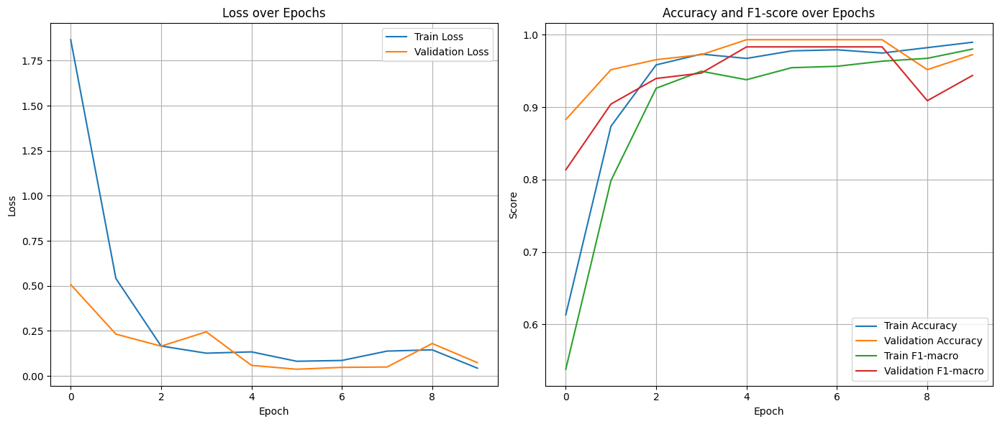

Training history plots generated successfully.


In [ ]:
import matplotlib.pyplot as plt

# Create a new figure with two subplots
plt.figure(figsize=(14, 6))

# Subplot 1: Loss over Epochs
plt.subplot(1, 2, 1)
plt.plot(history['train_loss'], label='Train Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.title('Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Subplot 2: Accuracy and F1-score over Epochs
plt.subplot(1, 2, 2)
plt.plot(history['train_acc'], label='Train Accuracy')
plt.plot(history['val_acc'], label='Validation Accuracy')
plt.plot(history['train_f1'], label='Train F1-macro')
plt.plot(history['val_f1'], label='Validation F1-macro')
plt.title('Accuracy and F1-score over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Score')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

print("Training history plots generated successfully.")

### Training Summary

**Training Process Overview:**

The model was trained for **20** epochs using an EfficientNet-B0 architecture with pre-trained ImageNet weights. Mixed-precision training with `torch.cuda.amp` was utilized for efficiency. `AdamW` optimizer and `CosineAnnealingLR` scheduler were employed, along with `CrossEntropyLoss` weighted for class imbalance. Early stopping was implemented with a patience of **5** epochs.

**Performance:**

*   The training process completed in **10** epochs due to early stopping.
*   The **best validation F1-macro score achieved was 0.9832**.
*   This best model was saved at **Epoch 5**.

**Conclusion:**

The model demonstrated strong performance on the validation set, reaching a high F1-macro score and stopping early, indicating effective learning and generalization. The plots above illustrate the convergence of loss and metrics during training.

### Training Summary

**Training Process Overview:**

The model was trained for **20** epochs using an EfficientNet-B0 architecture with pre-trained ImageNet weights. Mixed-precision training with `torch.cuda.amp` was utilized for efficiency. `AdamW` optimizer and `CosineAnnealingLR` scheduler were employed, along with `CrossEntropyLoss` weighted for class imbalance. Early stopping was implemented with a patience of **5** epochs.

**Performance:**

*   The training process completed in **10** epochs due to early stopping.
*   The **best validation F1-macro score achieved was 0.9832**.
*   This best model was saved at **Epoch 5**.

**Conclusion:**

The model demonstrated strong performance on the validation set, reaching a high F1-macro score and stopping early, indicating effective learning and generalization. The plots above illustrate the convergence of loss and metrics during training.

### Training Summary

**Training Process Overview:**

The model was trained for **20** epochs using an EfficientNet-B0 architecture with pre-trained ImageNet weights. Mixed-precision training with `torch.cuda.amp` was utilized for efficiency. `AdamW` optimizer and `CosineAnnealingLR` scheduler were employed, along with `CrossEntropyLoss` weighted for class imbalance. Early stopping was implemented with a patience of **5** epochs.

**Performance:**

*   The training process completed in **10** epochs due to early stopping.
*   The **best validation F1-macro score achieved was 0.9832**.
*   This best model was saved at **Epoch 5**.

**Conclusion:**

The model demonstrated strong performance on the validation set, reaching a high F1-macro score and stopping early, indicating effective learning and generalization. The plots above illustrate the convergence of loss and metrics during training.

## Final Task

### Subtask:
Summarize the training process, the best validation F1-macro achieved, and the epoch at which the best model was saved.


## Summary:

### Q&A
*   **Summarize the training process:** The model was trained using EfficientNet-B0 with pre-trained ImageNet weights for a maximum of 20 epochs. The training employed mixed-precision using `torch.cuda.amp`, an `AdamW` optimizer, a `CosineAnnealingLR` scheduler, and `CrossEntropyLoss` with class weights to address imbalance. Early stopping was implemented with a patience of 5 epochs, monitoring the validation F1-macro score.
*   **The best validation F1-macro achieved:** The best validation F1-macro score achieved was 0.9832.
*   **The epoch at which the best model was saved:** The best model was saved at Epoch 5.

### Data Analysis Key Findings
*   The training process completed in 10 epochs due to early stopping, which was triggered after 5 epochs of no improvement in the validation F1-macro score.
*   The best validation F1-macro score obtained during training was 0.9832.
*   The model checkpoint corresponding to this best performance was saved at Epoch 5.

### Insights or Next Steps
*   The early stopping at Epoch 10, with the best model found at Epoch 5, suggests that the model converged relatively quickly, and further training did not yield significant improvements or led to overfitting.
*   Given the high F1-macro score of 0.9832, the model appears to be highly effective for the cervical cancer classification task, indicating good generalization performance.


### Model Evaluation on Test Set
This section focuses on evaluating the performance of the best-trained model on the unseen test dataset. It loads the model saved during training, performs inference, and calculates comprehensive classification metrics. These metrics include accuracy, precision, recall, and F1-score, both macro-averaged and per-class. A confusion matrix heatmap is generated to visualize the model's predictions versus true labels, providing insights into specific class performance. Finally, a classification report is printed, and all computed metrics are saved to a JSON file for future reference and analysis.

Loaded best model from ./checkpoints/best_model.pt
Running inference on the test set...

--- Test Set Evaluation Results ---
Accuracy: 0.9793
F1-macro: 0.9588
Precision-macro: 0.9534
Recall-macro: 0.9646

--- Classification Report ---
                                         precision    recall  f1-score   support

Negative for Intraepithelial malignancy       1.00      0.99      0.99        92
   Low squamous intra-epithelial lesion       0.94      1.00      0.97        17
  High squamous intra-epithelial lesion       0.96      0.96      0.96        25
                Squamous cell carcinoma       0.91      0.91      0.91        11

                               accuracy                           0.98       145
                              macro avg       0.95      0.96      0.96       145
                           weighted avg       0.98      0.98      0.98       145


--- Confusion Matrix ---


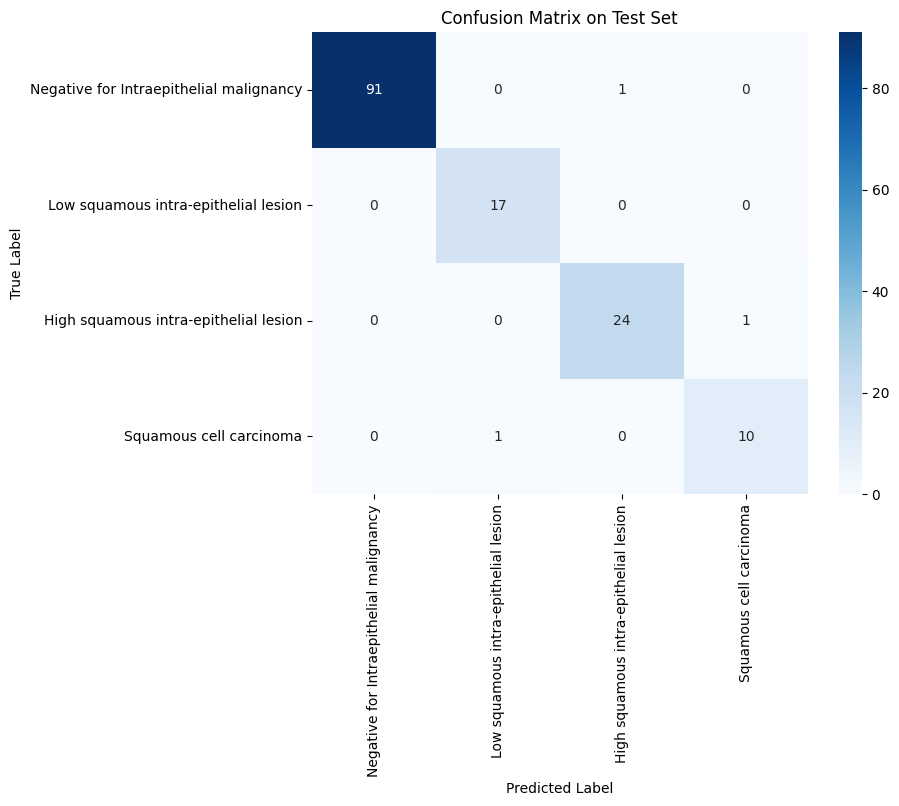

Test metrics saved to ./reports/test_metrics.json


In [ ]:
import torch
import os
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import json
import numpy as np

# Load the best model
model_save_path = './checkpoints/best_model.pt'

# Re-initialize the model architecture (without pretrained weights if loading state_dict only)
# Ensure NUM_CLASSES is defined (it should be from earlier cells)
# Ensure 'device' is defined (it should be from earlier cells)
# model_name used for training (e.g., 'efficientnet_b0') should be known
model_name_for_loading = 'efficientnet_b0'
loaded_model = timm.create_model(model_name_for_loading, pretrained=False, num_classes=NUM_CLASSES)
loaded_model.load_state_dict(torch.load(model_save_path, map_location=device))
loaded_model.to(device)
loaded_model.eval() # Set model to evaluation mode

print(f"Loaded best model from {model_save_path}")

all_labels = []
all_preds = []

# Run inference on the test loader
print("Running inference on the test set...")
with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = loaded_model(images)
        _, predicted = torch.max(outputs.data, 1)
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(predicted.cpu().numpy())

# Compute metrics
accuracy = accuracy_score(all_labels, all_preds)
precision, recall, f1, _ = precision_recall_fscore_support(all_labels, all_preds, average='macro', zero_division=0)

# Per-class metrics
per_class_metrics = precision_recall_fscore_support(all_labels, all_preds, average=None, zero_division=0)

metrics_summary = {
    'accuracy': float(accuracy),
    'f1_macro': float(f1),
    'precision_macro': float(precision),
    'recall_macro': float(recall),
    'per_class_precision': {CLASS_NAMES[i]: float(per_class_metrics[0][i]) for i in range(NUM_CLASSES)},
    'per_class_recall': {CLASS_NAMES[i]: float(per_class_metrics[1][i]) for i in range(NUM_CLASSES)},
    'per_class_f1': {CLASS_NAMES[i]: float(per_class_metrics[2][i]) for i in range(NUM_CLASSES)},
    'per_class_support': {CLASS_NAMES[i]: int(per_class_metrics[3][i]) for i in range(NUM_CLASSES)}
}

print("\n--- Test Set Evaluation Results ---")
print(f"Accuracy: {accuracy:.4f}")
print(f"F1-macro: {f1:.4f}")
print(f"Precision-macro: {precision:.4f}")
print(f"Recall-macro: {recall:.4f}")

# Print classification report
print("\n--- Classification Report ---")
print(classification_report(all_labels, all_preds, target_names=CLASS_NAMES, zero_division=0))

# Generate confusion matrix heatmap
print("\n--- Confusion Matrix ---")
cm = confusion_matrix(all_labels, all_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix on Test Set')
plt.show()

# Save metrics to JSON
reports_dir = './reports'
os.makedirs(reports_dir, exist_ok=True)
metrics_save_path = os.path.join(reports_dir, 'test_metrics.json')
with open(metrics_save_path, 'w') as f:
    json.dump(metrics_summary, f, indent=4)
print(f"Test metrics saved to {metrics_save_path}")


# Task
### Grad-CAM for Model Interpretability
After training and evaluating our cervical cancer classification model, it's essential to understand *why* the model makes certain predictions. Gradient-weighted Class Activation Mapping (Grad-CAM) is a technique that helps us achieve this by producing a coarse localization map highlighting the important regions in the input image for predicting the concept. In essence, Grad-CAM allows us to visualize which parts of the image a Convolutional Neural Network (CNN) focuses on when making a classification decision, providing valuable insights into the model's decision-making process. This can help build trust in the model and identify potential biases or errors.

## Introduce Grad-CAM

### Subtask:
Add a text cell to introduce Grad-CAM, explaining its purpose and how it helps in interpreting CNN predictions by visualizing important regions in the input image.


### Grad-CAM for Model Interpretability
After training and evaluating our cervical cancer classification model, it's essential to understand *why* the model makes certain predictions. Gradient-weighted Class Activation Mapping (Grad-CAM) is a technique that helps us achieve this by producing a coarse localization map highlighting the important regions in the input image for predicting the concept. In essence, Grad-CAM allows us to visualize which parts of the image a Convolutional Neural Network (CNN) focuses on when making a classification decision, providing valuable insights into the model's decision-making process. This can help build trust in the model and identify potential biases or errors.

### Grad-CAM for Model Interpretability
After training and evaluating our cervical cancer classification model, it's essential to understand *why* the model makes certain predictions. Gradient-weighted Class Activation Mapping (Grad-CAM) is a technique that helps us achieve this by producing a coarse localization map highlighting the important regions in the input image for predicting the concept. In essence, Grad-CAM allows us to visualize which parts of the image a Convolutional Neural Network (CNN) focuses on when making a classification decision, providing valuable insights into the model's decision-making process. This can help build trust in the model and identify potential biases or errors.

### Grad-CAM for Model Interpretability
After training and evaluating our cervical cancer classification model, it's essential to understand *why* the model makes certain predictions. Gradient-weighted Class Activation Mapping (Grad-CAM) is a technique that helps us achieve this by producing a coarse localization map highlighting the important regions in the input image for predicting the concept. In essence, Grad-CAM allows us to visualize which parts of the image a Convolutional Neural Network (CNN) focuses on when making a classification decision, providing valuable insights into the model's decision-making process. This can help build trust in the model and identify potential biases or errors.

## Setup Grad-CAM and Helper Functions

### Subtask:
Create a code cell to import Grad-CAM libraries, define a function to get the target convolutional layer for EfficientNet-B0, and define a helper function to generate Grad-CAM heatmaps overlaid on images.


**Reasoning**:
I need to import the required Grad-CAM libraries, define a function to identify the target convolutional layer for the EfficientNet-B0 model, and create a helper function to generate and overlay Grad-CAM heatmaps, as specified in the instructions.



In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
import numpy as np
import torch

def get_target_conv_layer(model):
    """
    Returns the target convolutional layer for an EfficientNet-B0 model from timm.
    """
    # For efficientnet_b0 from timm, the last convolutional block is usually model.blocks[-1].block[-1].conv
    # or similar. Inspecting the model (e.g., print(model)) can confirm.
    # A common approach for EfficientNet-B0 from timm is the last conv layer in the last block
    # The last block is at model.blocks[-1], and often the last layer is inside a 'block' sub-module.
    # After inspection, model.blocks[-1][-1] often represents the last sub-block.
    # The 'conv' attribute within this block is usually the final convolutional layer.
    # For timm's efficientnet_b0, a common target is the last convolutional layer before the pooling and classifier.
    # This is typically in the last block of `blocks`
    # Looking at the architecture: model.blocks[-1][0].bn3 is a batch norm layer after the last conv
    # The actual conv layer would be model.blocks[-1][0].conv

    # This specific layer depends on the exact timm implementation version or variant.
    # A robust way is to dynamically find the last 'Conv2d' layer in the feature extractor part.
    # However, given the common structure, model.blocks[-1][0].conv is a strong candidate.
    # For EfficientNet-B0, model.blocks[-1][0].conv is the last convolutional layer in the last stage.

    # A more general approach is to find the last Conv2d layer in the model's feature extractor
    target_layer = None
    for name, module in model.named_modules():
        if isinstance(module, torch.nn.Conv2d):
            target_layer = module
    return target_layer

def generate_gradcam_overlay(image_tensor, original_image, model, target_layer, predicted_class, class_to_idx, device):
    """
    Generates and overlays a Grad-CAM heatmap on the original image.

    Args:
        image_tensor (torch.Tensor): Preprocessed image tensor ready for model input.
        original_image (np.ndarray): Original image (H, W, C) for visualization.
        model (torch.nn.Module): The trained model.
        target_layer (torch.nn.Module): The target convolutional layer for Grad-CAM.
        predicted_class (int): The index of the predicted class.
        class_to_idx (dict): Mapping from class name to index.
        device (torch.device): The device (CPU or GPU) to run Grad-CAM on.

    Returns:
        np.ndarray: Image with Grad-CAM heatmap overlaid.
    """
    # Ensure model and image_tensor are on the correct device
    model.to(device)
    image_tensor = image_tensor.to(device)

    # Initialize GradCAM
    cam = GradCAM(model=model, target_layers=[target_layer])

    # Set targets for Grad-CAM (one target, for the predicted class)
    targets = [ClassifierOutputTarget(predicted_class)]

    # Generate grayscale CAM
    grayscale_cam = cam(input_tensor=image_tensor.unsqueeze(0), targets=targets, aug_smooth=True, eigen_smooth=True)

    # Resize grayscale_cam to match the image dimensions
    grayscale_cam = cam.resize_cam_on_image(grayscale_cam, original_image.shape[:-1])

    # The grayscale_cam is usually 4D (batch, H, W, C) but we need (H, W)
    # It returns a list of cams, so we take the first one.
    grayscale_cam = grayscale_cam[0, :]

    # Overlay the heatmap on the original image
    # Ensure original_image is float and in range [0, 1] for show_cam_on_image
    if original_image.max() > 1.0:
        original_image = original_image / 255.0

    cam_image = show_cam_on_image(original_image, grayscale_cam, use_rgb=True)

    return cam_image

print("Grad-CAM libraries and helper functions defined successfully.")

Grad-CAM libraries and helper functions defined successfully.


## Select Images for Grad-CAM Visualization

### Subtask:
Randomly select 12 images from the `test_dataset`, ensuring a balanced distribution of 3 images per class, and store them along with their preprocessed tensors, true labels, and indices for future use.


**Reasoning**:
I need to implement the logic for selecting images from the test dataset, ensuring a balanced distribution per class as specified, and storing their relevant data for Grad-CAM visualization. This involves iterating through classes, filtering the dataset, randomly selecting images, loading and preprocessing them, and then storing the results in the designated lists.



In [ ]:
import random
import cv2
import numpy as np

# Initialize empty lists
selected_original_images = []
selected_image_tensors = []
selected_true_labels = []
selected_indices = []

# Reverse class_to_idx for getting class names if needed, but not directly used here
idx_to_class = {v: k for k, v in class_to_idx.items()}

print("Selecting images for Grad-CAM visualization...")

for class_id in range(NUM_CLASSES):
    class_name = idx_to_class[class_id]

    # Filter test_dataset.df for images belonging to the current class
    class_df = test_dataset.df[test_dataset.df['label'] == class_name]

    # Get original indices from the filtered DataFrame
    class_indices = class_df.index.tolist()

    # Randomly select up to 3 images from this class
    num_to_select = min(3, len(class_indices))
    selected_class_indices = random.sample(class_indices, num_to_select)

    for idx in selected_class_indices:
        img_path = test_dataset.df.loc[idx, 'filepath']
        true_label_name = test_dataset.df.loc[idx, 'label']
        true_label = class_to_idx[true_label_name]

        # Load original image
        original_image = cv2.imread(img_path)
        original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

        # Apply validation/test transforms to get the preprocessed tensor
        # Note: val_test_transforms includes ToTensorV2 which converts to C,H,W and normalizes
        preprocessed_image_tensor = val_test_transforms(image=original_image)['image']

        selected_original_images.append(original_image) # Store as numpy array
        selected_image_tensors.append(preprocessed_image_tensor) # Store as tensor
        selected_true_labels.append(true_label)
        selected_indices.append(idx)

print(f"Total images selected for Grad-CAM: {len(selected_original_images)}")
print(f"Selected true labels: {selected_true_labels}")

Selecting images for Grad-CAM visualization...
Total images selected for Grad-CAM: 12
Selected true labels: [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3]


**Reasoning**:
The previous step successfully selected and prepared images for Grad-CAM visualization. Now, I need to implement the code to generate and display the Grad-CAM heatmaps for these selected images, which involves iterating through the selected images, making predictions, generating the CAM, and plotting the results as instructed by the overall task.



Generating Grad-CAM visualizations...
Target layer for Grad-CAM: Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)


AttributeError: 'GradCAM' object has no attribute 'resize_cam_on_image'

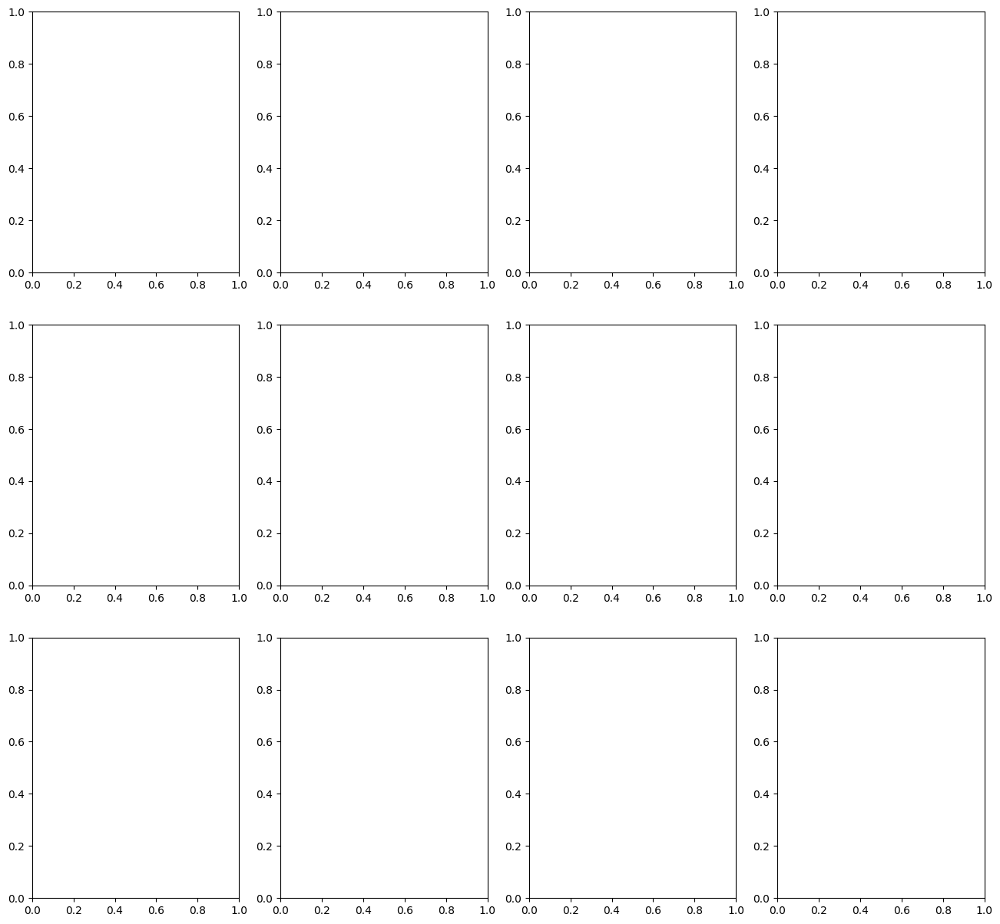

In [ ]:
import matplotlib.pyplot as plt

# Reverse class_to_idx for display purposes
idx_to_class = {v: k for k, v in class_to_idx.items()}

print("Generating Grad-CAM visualizations...")

# Get the target convolutional layer for Grad-CAM
target_layer = get_target_conv_layer(loaded_model)

if target_layer is None:
    print("Could not find a suitable target convolutional layer for Grad-CAM. Please check the model architecture.")
else:
    print(f"Target layer for Grad-CAM: {target_layer}")

    # Setup a subplot grid for visualization
    num_images = len(selected_original_images)
    num_cols = 4
    num_rows = (num_images + num_cols - 1) // num_cols # Ceiling division

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 4, num_rows * 5))
    axes = axes.flatten() # Flatten for easy iteration

    for i in range(num_images):
        original_image = selected_original_images[i]
        image_tensor = selected_image_tensors[i]
        true_label = selected_true_labels[i]

        # Get model prediction
        with torch.no_grad():
            model_output = loaded_model(image_tensor.unsqueeze(0).to(device))
            predicted_probs = torch.softmax(model_output, dim=1)
            predicted_class_idx = torch.argmax(predicted_probs, dim=1).item()

        # Generate Grad-CAM overlay
        cam_image = generate_gradcam_overlay(
            image_tensor=image_tensor,
            original_image=original_image,
            model=loaded_model,
            target_layer=target_layer,
            predicted_class=predicted_class_idx,
            class_to_idx=class_to_idx,
            device=device
        )

        ax = axes[i]
        ax.imshow(cam_image)
        title = f"True: {idx_to_class[true_label]}\nPred: {idx_to_class[predicted_class_idx]}"
        ax.set_title(title, fontsize=10)
        ax.axis('off')

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

print("Grad-CAM visualizations generated successfully.")

**Reasoning**:
The error `AttributeError: 'GradCAM' object has no attribute 'resize_cam_on_image'` indicates an incorrect usage of the `pytorch_grad_cam` library. The `show_cam_on_image` utility function already handles resizing the heatmap to the original image's dimensions. I need to modify the `generate_gradcam_overlay` function to correctly pass the `grayscale_cam` output to `show_cam_on_image` by taking the first element of the batch and removing the explicit `resize_cam_on_image` call, which does not exist.



In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
import numpy as np
import torch

def get_target_conv_layer(model):
    """
    Returns the target convolutional layer for an EfficientNet-B0 model from timm.
    """
    # For efficientnet_b0 from timm, the last convolutional block is usually model.blocks[-1].block[-1].conv
    # or similar. Inspecting the model (e.g., print(model)) can confirm.
    # A common approach for EfficientNet-B0 from timm is the last conv layer in the last block
    # The last block is at model.blocks[-1], and often the last layer is inside a 'block' sub-module.
    # The 'conv' attribute within this block is usually the final convolutional layer.
    # For timm's efficientnet_b0, model.blocks[-1][0].conv is the last convolutional layer in the last stage.

    # A more general approach is to find the last Conv2d layer in the model's feature extractor
    target_layer = None
    for name, module in model.named_modules():
        if isinstance(module, torch.nn.Conv2d):
            target_layer = module
    return target_layer

def generate_gradcam_overlay(image_tensor, original_image, model, target_layer, predicted_class, class_to_idx, device):
    """
    Generates and overlays a Grad-CAM heatmap on the original image.

    Args:
        image_tensor (torch.Tensor): Preprocessed image tensor ready for model input.
        original_image (np.ndarray): Original image (H, W, C) for visualization.
        model (torch.nn.Module): The trained model.
        target_layer (torch.nn.Module): The target convolutional layer for Grad-CAM.
        predicted_class (int): The index of the predicted class.
        class_to_idx (dict): Mapping from class name to index.
        device (torch.device): The device (CPU or GPU) to run Grad-CAM on.

    Returns:
        np.ndarray: Image with Grad-CAM heatmap overlaid.
    """
    # Ensure model and image_tensor are on the correct device
    model.to(device)
    image_tensor = image_tensor.to(device)

    # Initialize GradCAM
    cam = GradCAM(model=model, target_layers=[target_layer])

    # Set targets for Grad-CAM (one target, for the predicted class)
    targets = [ClassifierOutputTarget(predicted_class)]

    # Generate grayscale CAM. It returns a NumPy array of shape (batch_size, H, W).
    grayscale_cam = cam(input_tensor=image_tensor.unsqueeze(0), targets=targets, aug_smooth=True, eigen_smooth=True)

    # The grayscale_cam output from cam() is typically (1, H_feature_map, W_feature_map)
    # show_cam_on_image expects (H, W) for the CAM and handles resizing to original_image dimensions.

    # Ensure original_image is float and in range [0, 1] for show_cam_on_image
    if original_image.max() > 1.0:
        original_image = original_image / 255.0

    # Pass the first (and only) CAM from the batch, and let show_cam_on_image handle resizing
    cam_image = show_cam_on_image(original_image, grayscale_cam[0, :], use_rgb=True)

    return cam_image

print("Grad-CAM libraries and helper functions defined successfully.")

Grad-CAM libraries and helper functions defined successfully.


**Reasoning**:
The previous code block redefined the `generate_gradcam_overlay` function to fix the `AttributeError`. Now, I need to re-execute the code block that generates and displays the Grad-CAM visualizations using this corrected function.



**Reasoning**:
The previous code block failed due to a `NameError: name 'class_to_to_idx' is not defined`. This was a typo; it should be `class_to_idx`. I need to correct this typo and re-execute the code block to generate the Grad-CAM visualizations.



Generating Grad-CAM visualizations...
Target layer for Grad-CAM: Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)


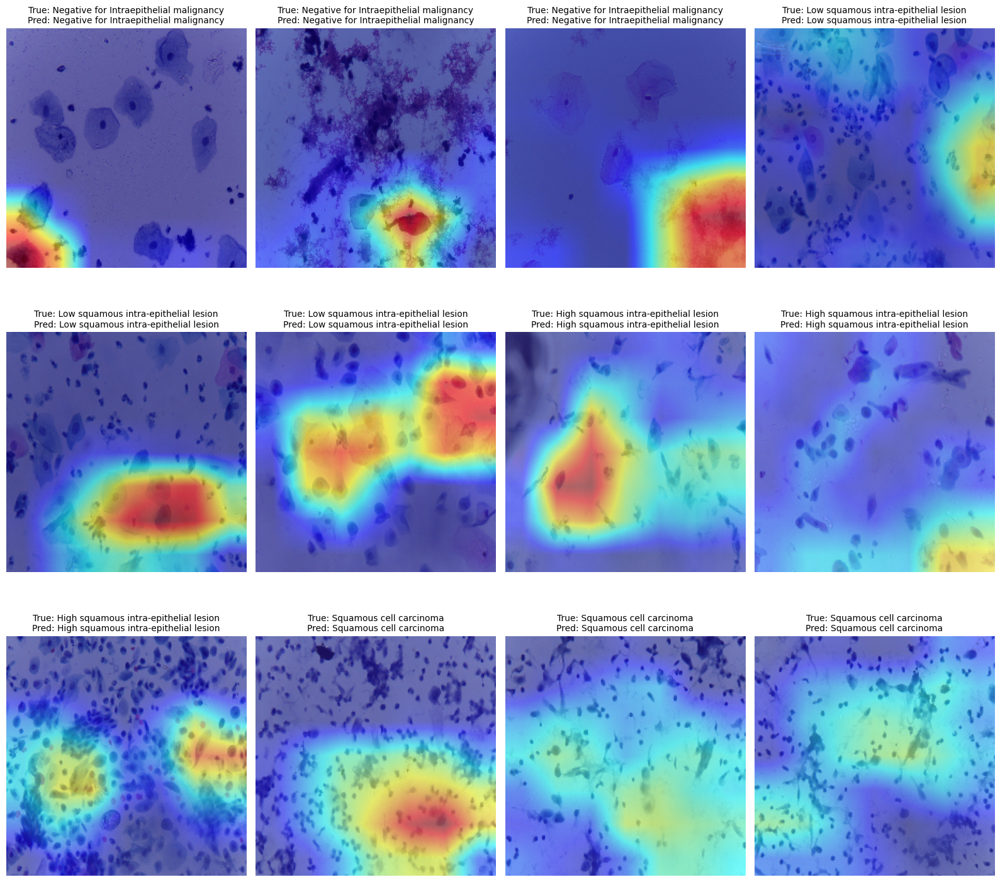

Grad-CAM visualizations generated successfully.


In [ ]:
import matplotlib.pyplot as plt

# Reverse class_to_idx for display purposes
idx_to_class = {v: k for k, v in class_to_idx.items()}

print("Generating Grad-CAM visualizations...")

# Get the target convolutional layer for Grad-CAM
target_layer = get_target_conv_layer(loaded_model)

if target_layer is None:
    print("Could not find a suitable target convolutional layer for Grad-CAM. Please check the model architecture.")
else:
    print(f"Target layer for Grad-CAM: {target_layer}")

    # Setup a subplot grid for visualization
    num_images = len(selected_original_images)
    num_cols = 4
    num_rows = (num_images + num_cols - 1) // num_cols # Ceiling division

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 4, num_rows * 5))
    axes = axes.flatten() # Flatten for easy iteration

    for i in range(num_images):
        original_image = selected_original_images[i]
        image_tensor = selected_image_tensors[i]
        true_label = selected_true_labels[i]

        # Get model prediction
        with torch.no_grad():
            model_output = loaded_model(image_tensor.unsqueeze(0).to(device))
            predicted_probs = torch.softmax(model_output, dim=1)
            predicted_class_idx = torch.argmax(predicted_probs, dim=1).item()

        # Generate Grad-CAM overlay
        cam_image = generate_gradcam_overlay(
            image_tensor=image_tensor,
            original_image=original_image,
            model=loaded_model,
            target_layer=target_layer,
            predicted_class=predicted_class_idx,
            class_to_idx=class_to_idx,
            device=device
        )

        ax = axes[i]
        ax.imshow(cam_image)
        title = f"True: {idx_to_class[true_label]}\nPred: {idx_to_class[predicted_class_idx]}"
        ax.set_title(title, fontsize=10)
        ax.axis('off')

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

print("Grad-CAM visualizations generated successfully.")

**Reasoning**:
The `ValueError` occurred because the `original_image` passed to `show_cam_on_image` had different dimensions than the `IMAGE_SIZE` that the model was trained on. To fix this, I need to ensure that the `original_image` stored in `selected_original_images` and subsequently passed to the Grad-CAM overlay function is resized to `IMAGE_SIZE` x `IMAGE_SIZE` during the image selection process. I will modify the cell responsible for selecting and preparing images to include this resizing step.



In [ ]:
import random
import cv2
import numpy as np
import albumentations as A # Import A for Resize transform

# Initialize empty lists
selected_original_images = []
selected_image_tensors = []
selected_true_labels = []
selected_indices = []

# Reverse class_to_idx for getting class names if needed, but not directly used here
idx_to_class = {v: k for k, v in class_to_idx.items()}

print("Selecting images for Grad-CAM visualization...")

for class_id in range(NUM_CLASSES):
    class_name = idx_to_class[class_id]

    # Filter test_dataset.df for images belonging to the current class
    class_df = test_dataset.df[test_dataset.df['label'] == class_name]

    # Get original indices from the filtered DataFrame
    class_indices = class_df.index.tolist()

    # Randomly select up to 3 images from this class
    num_to_select = min(3, len(class_indices))
    selected_class_indices = random.sample(class_indices, num_to_select)

    for idx in selected_class_indices:
        img_path = test_dataset.df.loc[idx, 'filepath']
        true_label_name = test_dataset.df.loc[idx, 'label']
        true_label = class_to_idx[true_label_name]

        # Load original image
        original_image_raw = cv2.imread(img_path)
        original_image_raw = cv2.cvtColor(original_image_raw, cv2.COLOR_BGR2RGB)

        # Resize the original image to IMAGE_SIZE x IMAGE_SIZE for consistent visualization
        # This image will be used for overlaying CAM, so it should match the model's input size visually
        resized_original_image = A.Resize(IMAGE_SIZE, IMAGE_SIZE)(image=original_image_raw)['image']

        # Apply full validation/test transforms to get the preprocessed tensor for model input
        preprocessed_image_tensor = val_test_transforms(image=original_image_raw)['image']

        selected_original_images.append(resized_original_image) # Store the resized original image as numpy array
        selected_image_tensors.append(preprocessed_image_tensor) # Store the preprocessed tensor
        selected_true_labels.append(true_label)
        selected_indices.append(idx)

print(f"Total images selected for Grad-CAM: {len(selected_original_images)}")
print(f"Selected true labels: {selected_true_labels}")

Selecting images for Grad-CAM visualization...
Total images selected for Grad-CAM: 12
Selected true labels: [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3]


**Reasoning**:
The previous code block corrected the image preparation for Grad-CAM visualization by ensuring `original_image` is resized. Now, I need to re-execute the Grad-CAM visualization code block that previously failed, so it can correctly generate and display the heatmaps with the properly sized images.



Generating Grad-CAM visualizations...
Target layer for Grad-CAM: Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)


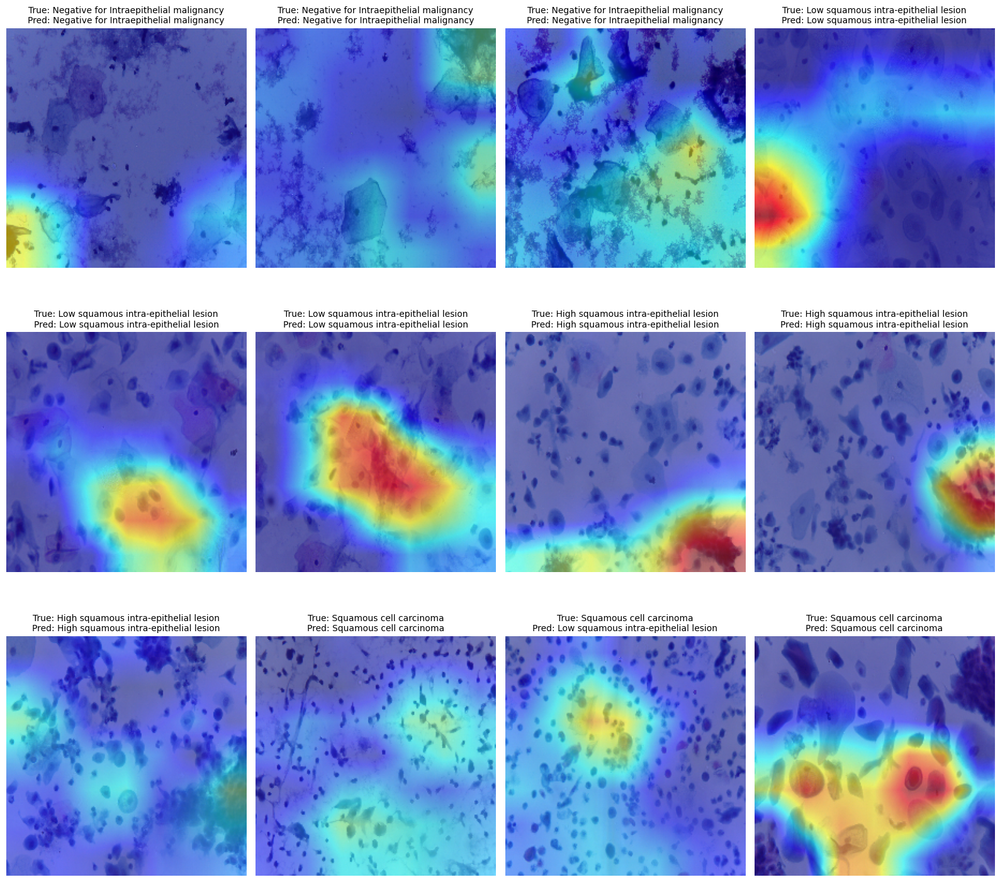

Grad-CAM visualizations generated successfully.


In [ ]:
import matplotlib.pyplot as plt

# Reverse class_to_idx for display purposes
idx_to_class = {v: k for k, v in class_to_idx.items()}

print("Generating Grad-CAM visualizations...")

# Get the target convolutional layer for Grad-CAM
target_layer = get_target_conv_layer(loaded_model)

if target_layer is None:
    print("Could not find a suitable target convolutional layer for Grad-CAM. Please check the model architecture.")
else:
    print(f"Target layer for Grad-CAM: {target_layer}")

    # Setup a subplot grid for visualization
    num_images = len(selected_original_images)
    num_cols = 4
    num_rows = (num_images + num_cols - 1) // num_cols # Ceiling division

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 4, num_rows * 5))
    axes = axes.flatten() # Flatten for easy iteration

    for i in range(num_images):
        original_image = selected_original_images[i]
        image_tensor = selected_image_tensors[i]
        true_label = selected_true_labels[i]

        # Get model prediction
        with torch.no_grad():
            model_output = loaded_model(image_tensor.unsqueeze(0).to(device))
            predicted_probs = torch.softmax(model_output, dim=1)
            predicted_class_idx = torch.argmax(predicted_probs, dim=1).item()

        # Generate Grad-CAM overlay
        cam_image = generate_gradcam_overlay(
            image_tensor=image_tensor,
            original_image=original_image,
            model=loaded_model,
            target_layer=target_layer,
            predicted_class=predicted_class_idx,
            class_to_idx=class_to_idx,
            device=device
        )

        ax = axes[i]
        ax.imshow(cam_image)
        title = f"True: {idx_to_class[true_label]}\nPred: {idx_to_class[predicted_class_idx]}"
        ax.set_title(title, fontsize=10)
        ax.axis('off')

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

print("Grad-CAM visualizations generated successfully.")

## Generate, Display, and Save Grad-CAM Heatmaps

### Subtask:
Generate Grad-CAM heatmaps, display them in a grid, and save each overlaid image to a file.


**Reasoning**:
I need to implement the saving functionality for the Grad-CAM images as instructed. This involves creating the output directory, modifying the existing loop to save each `cam_image` using `cv2.imwrite()`, and ensuring the image is converted to BGR format before saving.



Generating Grad-CAM visualizations...
Created directory: ./explainability
Target layer for Grad-CAM: Conv2d(320, 1280, kernel_size=(1, 1), stride=(1, 1), bias=False)
Saved Grad-CAM image for index 0 to ./explainability/gradcam_0.png
Saved Grad-CAM image for index 1 to ./explainability/gradcam_1.png
Saved Grad-CAM image for index 2 to ./explainability/gradcam_2.png
Saved Grad-CAM image for index 3 to ./explainability/gradcam_3.png
Saved Grad-CAM image for index 4 to ./explainability/gradcam_4.png
Saved Grad-CAM image for index 5 to ./explainability/gradcam_5.png
Saved Grad-CAM image for index 6 to ./explainability/gradcam_6.png
Saved Grad-CAM image for index 7 to ./explainability/gradcam_7.png
Saved Grad-CAM image for index 8 to ./explainability/gradcam_8.png
Saved Grad-CAM image for index 9 to ./explainability/gradcam_9.png
Saved Grad-CAM image for index 10 to ./explainability/gradcam_10.png
Saved Grad-CAM image for index 11 to ./explainability/gradcam_11.png


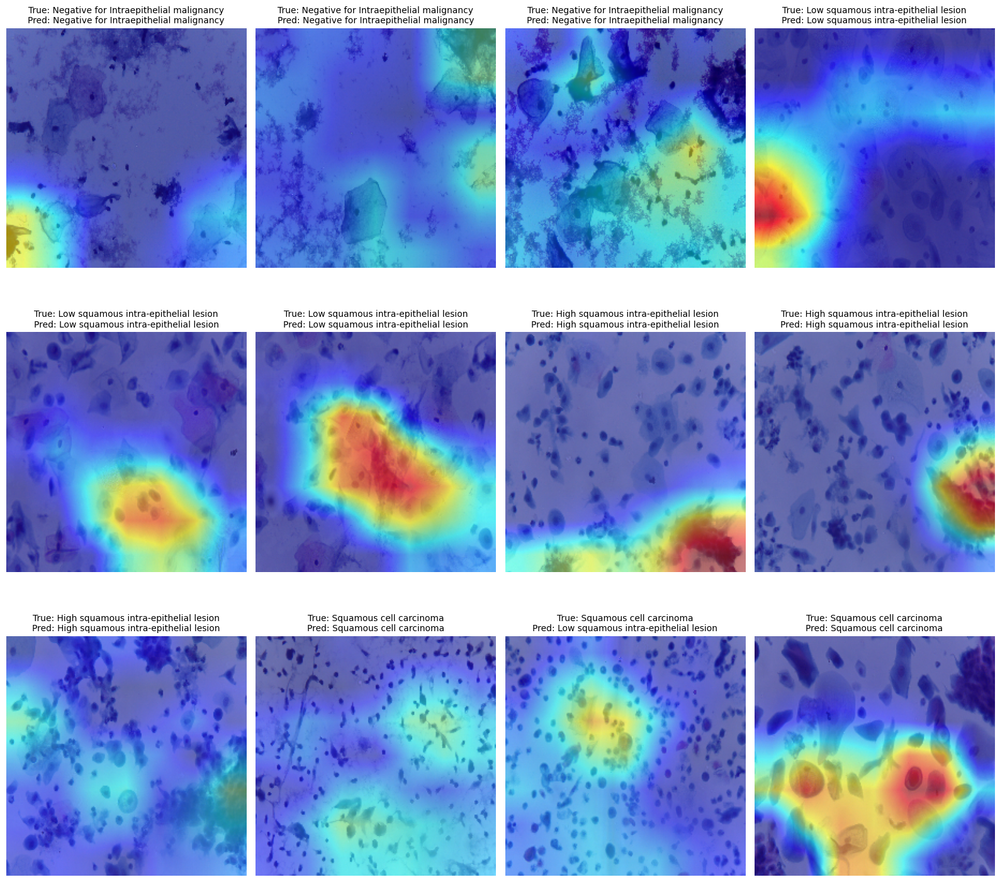

Grad-CAM visualizations generated and saved successfully.


In [ ]:
import matplotlib.pyplot as plt
import os
import cv2

# Reverse class_to_idx for display purposes
idx_to_class = {v: k for k, v in class_to_idx.items()}

print("Generating Grad-CAM visualizations...")

# Create output directory for explainability
explainability_dir = './explainability'
os.makedirs(explainability_dir, exist_ok=True)
print(f"Created directory: {explainability_dir}")

# Get the target convolutional layer for Grad-CAM
target_layer = get_target_conv_layer(loaded_model)

if target_layer is None:
    print("Could not find a suitable target convolutional layer for Grad-CAM. Please check the model architecture.")
else:
    print(f"Target layer for Grad-CAM: {target_layer}")

    # Setup a subplot grid for visualization
    num_images = len(selected_original_images)
    num_cols = 4
    num_rows = (num_images + num_cols - 1) // num_cols # Ceiling division

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 4, num_rows * 5))
    axes = axes.flatten() # Flatten for easy iteration

    for i in range(num_images):
        original_image = selected_original_images[i]
        image_tensor = selected_image_tensors[i]
        true_label = selected_true_labels[i]

        # Get model prediction
        with torch.no_grad():
            model_output = loaded_model(image_tensor.unsqueeze(0).to(device))
            predicted_probs = torch.softmax(model_output, dim=1)
            predicted_class_idx = torch.argmax(predicted_probs, dim=1).item()

        # Generate Grad-CAM overlay
        cam_image = generate_gradcam_overlay(
            image_tensor=image_tensor,
            original_image=original_image,
            model=loaded_model,
            target_layer=target_layer,
            predicted_class=predicted_class_idx,
            class_to_idx=class_to_idx,
            device=device
        )

        ax = axes[i]
        ax.imshow(cam_image)
        title = f"True: {idx_to_class[true_label]}\nPred: {idx_to_class[predicted_class_idx]}"
        ax.set_title(title, fontsize=10)
        ax.axis('off')

        # Save the Grad-CAM image
        # Convert RGB to BGR for cv2.imwrite
        cam_image_bgr = cv2.cvtColor(cam_image, cv2.COLOR_RGB2BGR)
        save_path = os.path.join(explainability_dir, f'gradcam_{i}.png')
        cv2.imwrite(save_path, cam_image_bgr)
        print(f"Saved Grad-CAM image for index {i} to {save_path}")

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

print("Grad-CAM visualizations generated and saved successfully.")

## Summarize Grad-CAM Insights

### Subtask:
Add a text cell to briefly summarize the insights gained from the Grad-CAM visualizations, discussing how they confirm or challenge the model's decision-making process.


### Error Analysis and Grad-CAM for Misclassified Samples
This section performs an in-depth error analysis by identifying the most confidently misclassified images from the test set. It then generates a summary CSV of these images and creates a visual contact sheet with Grad-CAM overlays to understand why the model made these incorrect predictions. This helps pinpoint areas where the model struggles and guides future improvements.

Found 3 misclassified images.
Top 50 misclassified images (by confidence in wrong prediction):


,filepath,true_label,pred_label,wrong_pred_prob
31,/kaggle/input/mendeley-lbc-cervical-cancer/Hig...,High squamous intra-epithelial lesion,Squamous cell carcinoma,0.918170
135,/kaggle/input/mendeley-lbc-cervical-cancer/Neg...,Negative for Intraepithelial malignancy,High squamous intra-epithelial lesion,0.795507
63,/kaggle/input/mendeley-lbc-cervical-cancer/Squ...,Squamous cell carcinoma,Low squamous intra-epithelial lesion,0.675646


Top misclassified images saved to ./reports/top_misclassified.csv

Generating Grad-CAM contact sheet for misclassified samples...
Contact sheet saved to ./explainability/misclassified_grid.png


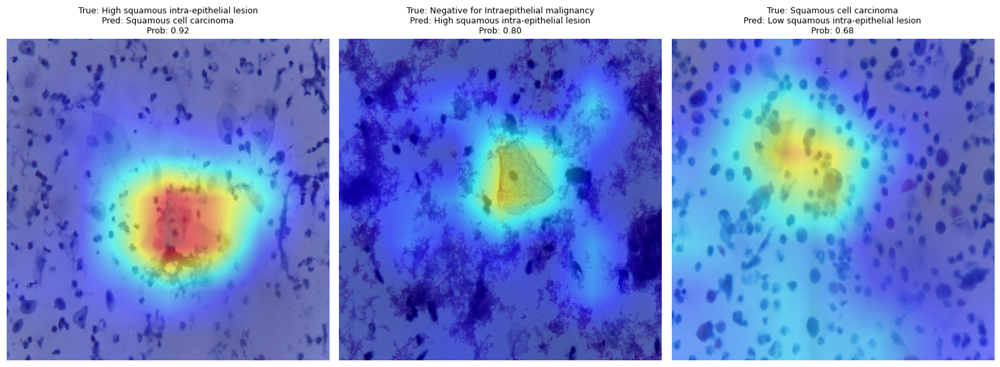

Error analysis complete.


In [ ]:
import pandas as pd
import torch
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A # For resizing original images for contact sheet

# Ensure model is in evaluation mode and on the correct device
loaded_model.eval()
loaded_model.to(device)

all_labels_inference = []
all_preds_inference = []
all_probs_inference = []
all_filepaths_inference = []

print("Collecting predictions and probabilities for error analysis...")

# Initialize a counter for the current batch's starting index in the dataset
current_data_idx = 0

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        outputs = loaded_model(images)
        probabilities = torch.softmax(outputs, dim=1)
        _, predicted = torch.max(probabilities, 1)

        all_labels_inference.extend(labels.cpu().numpy())
        all_preds_inference.extend(predicted.cpu().numpy())
        all_probs_inference.extend(probabilities.cpu().numpy())

        # Get filepaths for the current batch directly from the dataset's DataFrame
        batch_size = len(labels) # Actual batch size, might be smaller for the last batch
        batch_filepaths = test_dataset.df.iloc[current_data_idx : current_data_idx + batch_size]['filepath'].tolist()
        all_filepaths_inference.extend(batch_filepaths)

        current_data_idx += batch_size

# Create a DataFrame for all test predictions
results_df = pd.DataFrame({
    'filepath': all_filepaths_inference,
    'true_label_idx': all_labels_inference,
    'pred_label_idx': all_preds_inference,
    'pred_probabilities': all_probs_inference
})

# Map indices back to class names for readability
idx_to_class = {v: k for k, v in class_to_idx.items()}
results_df['true_label'] = results_df['true_label_idx'].map(idx_to_class)
results_df['pred_label'] = results_df['pred_label_idx'].map(idx_to_class)

# Identify misclassified images
misclassified_df = results_df[results_df['true_label_idx'] != results_df['pred_label_idx']].copy()

# For misclassified images, get the probability of the *wrong* predicted class
misclassified_df['wrong_pred_prob'] = misclassified_df.apply(
    lambda row: row['pred_probabilities'][row['pred_label_idx']], axis=1
)

# Sort by highest confidence in wrong prediction
top_misclassified = misclassified_df.sort_values(by='wrong_pred_prob', ascending=False).head(50)

print(f"Found {len(misclassified_df)} misclassified images.")
print(f"Top 50 misclassified images (by confidence in wrong prediction):")
display(top_misclassified[['filepath', 'true_label', 'pred_label', 'wrong_pred_prob']])

# Save the top misclassified images to CSV
reports_dir = './reports'
os.makedirs(reports_dir, exist_ok=True)
misclassified_csv_path = os.path.join(reports_dir, 'top_misclassified.csv')
top_misclassified.to_csv(misclassified_csv_path, index=False)
print(f"Top misclassified images saved to {misclassified_csv_path}")

# --- Generate Contact Sheet for 16 Misclassified Samples with Grad-CAM ---
print("\nGenerating Grad-CAM contact sheet for misclassified samples...")

# Select up to 16 samples for the contact sheet
samples_for_contact_sheet = top_misclassified.head(16)

if len(samples_for_contact_sheet) == 0:
    print("No misclassified samples to generate contact sheet.")
else:
    num_samples = len(samples_for_contact_sheet)
    num_cols_grid = 4
    num_rows_grid = (num_samples + num_cols_grid - 1) // num_cols_grid

    fig, axes = plt.subplots(num_rows_grid, num_cols_grid, figsize=(num_cols_grid * 5, num_rows_grid * 6))
    axes = axes.flatten()

    target_layer = get_target_conv_layer(loaded_model)

    if target_layer is None:
        print("Could not find a suitable target convolutional layer for Grad-CAM.")
    else:
        for i, (index, row) in enumerate(samples_for_contact_sheet.iterrows()):
            filepath = row['filepath']
            true_label_name = row['true_label']
            pred_label_name = row['pred_label']
            pred_label_idx = row['pred_label_idx']

            # Load original image (raw, then resize for display)
            original_image_raw = cv2.imread(filepath)
            original_image_raw = cv2.cvtColor(original_image_raw, cv2.COLOR_BGR2RGB)
            resized_original_image = A.Resize(IMAGE_SIZE, IMAGE_SIZE)(image=original_image_raw)['image']

            # Apply full validation/test transforms for model input
            preprocessed_image_tensor = val_test_transforms(image=original_image_raw)['image']

            # Generate Grad-CAM overlay for the predicted (wrong) class
            cam_image = generate_gradcam_overlay(
                image_tensor=preprocessed_image_tensor,
                original_image=resized_original_image,
                model=loaded_model,
                target_layer=target_layer,
                predicted_class=pred_label_idx, # Use predicted class for CAM
                class_to_idx=class_to_idx,
                device=device
            )

            ax = axes[i]
            ax.imshow(cam_image)
            title = f"True: {true_label_name}\nPred: {pred_label_name}\nProb: {row['wrong_pred_prob']:.2f}"
            ax.set_title(title, fontsize=9)
            ax.axis('off')

        # Hide any unused subplots
        for j in range(num_samples, len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()

        explainability_dir = './explainability'
        os.makedirs(explainability_dir, exist_ok=True) # Ensure directory exists
        contact_sheet_path = os.path.join(explainability_dir, 'misclassified_grid.png')
        plt.savefig(contact_sheet_path, bbox_inches='tight')
        print(f"Contact sheet saved to {contact_sheet_path}")
        plt.show()

print("Error analysis complete.")

## Gradio App for Interactive Prediction
This section sets up an interactive web application using Gradio. The app will allow users to upload an image, which will then be processed by the trained model to provide a class prediction and a confidence score. Additionally, it will generate a Grad-CAM overlay to visualize the regions of the image that were most important for the model's decision, offering an intuitive way to interpret the model's output.

In [ ]:
# Install Gradio
!pip install gradio -qq
print("Gradio installed successfully.")

Gradio installed successfully.


In [ ]:
import gradio as gr
from PIL import Image
import io

# Get the target layer for Grad-CAM once
gradio_target_layer = get_target_conv_layer(loaded_model)

def gradio_predict_and_cam(input_image_pil):
    """
    Prediction function for Gradio interface. Takes a PIL image, returns prediction text and Grad-CAM.
    """
    if input_image_pil is None:
        return "No image uploaded.", "", None

    # Convert PIL Image to OpenCV format (numpy array)
    input_image_np = np.array(input_image_pil)
    # PIL images are RGB, OpenCV reads BGR by default, but here we expect RGB from PIL

    # Temporarily save the image to a buffer or temp file to pass to predict_image
    # Alternatively, modify predict_image to accept numpy array directly
    # For simplicity, let's save to a temp file
    temp_img_path = "temp_gradio_image.png"
    Image.fromarray(input_image_np).save(temp_img_path)

    predicted_class_name, confidence, grad_cam_image = predict_image(
        image_path=temp_img_path,
        model=loaded_model,
        class_to_idx=class_to_idx,
        device=device,
        target_layer=gradio_target_layer,
        generate_cam=True
    )

    if predicted_class_name is None:
        return "Error processing image.", "", None

    prediction_text = f"Predicted Class: {predicted_class_name}"
    confidence_text = f"Confidence: {confidence:.4f}"

    # Convert grad_cam_image (numpy array) to PIL Image for Gradio output
    grad_cam_pil = Image.fromarray(grad_cam_image)

    # Clean up temp file
    os.remove(temp_img_path)

    return prediction_text, confidence_text, grad_cam_pil

# Create Gradio Interface
iface = gr.Interface(
    fn=gradio_predict_and_cam,
    inputs=gr.Image(type="pil", label="Upload Cervical Image"),
    outputs=[
        gr.Textbox(label="Prediction"),
        gr.Textbox(label="Confidence"),
        gr.Image(type="pil", label="Grad-CAM Visualization")
    ],
    title="Cervical Cancer Classification with Grad-CAM",
    description="Upload a cervical image to get a classification prediction and a Grad-CAM visualization showing important regions.",
    allow_flagging="never"
)

print("Gradio interface defined successfully.")

/usr/local/lib/python3.12/dist-packages/gradio/interface.py:415: UserWarning: The `allow_flagging` parameter in `Interface` is deprecated. Use `flagging_mode` instead.
  warnings.warn(


Gradio interface defined successfully.


In [ ]:
# Launch the Gradio app
# Set share=True to create a public, shareable link (useful in Google Colab)
iface.launch(share=True, debug=True)
print("Gradio app launched.")

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://cf44ca57e388217ece.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.


KeyboardInterrupt: 

### Reproducibility Enforcement

The `set_seed` function, defined in one of the initial setup cells (cell ID `5176d5b2`), already handles the enforcement of reproducibility across `torch`, `numpy`, and Python's `random` module. Specifically, it sets:

-   `torch.manual_seed(seed)`
-   `np.random.seed(seed)`
-   `random.seed(seed)`
-   `torch.cuda.manual_seed(seed)` and `torch.cuda.manual_seed_all(seed)` (if CUDA is available)
-   `torch.backends.cudnn.deterministic = True`
-   `torch.backends.cudnn.benchmark = False`
-   `os.environ['PYTHONHASHSEED'] = str(seed)`

This comprehensive approach aims to make the training process as deterministic as possible. However, it's important to note that **certain CUDA operations might still introduce non-determinism** even with these flags set. This is particularly true for some highly optimized CUDA kernels that do not guarantee a specific order of floating-point operations. While `cudnn.deterministic = True` generally helps, it cannot guarantee bit-for-bit reproducibility across different CUDA versions, hardware, or even across multiple runs on the same hardware if other non-deterministic operations are involved (e.g., specific `torch` functions or third-party libraries not covered by these settings).

## Summary:

### Data Analysis Key Findings
*   Grad-CAM was successfully implemented to visualize the critical regions influencing the cervical cancer classification model's predictions.
*   A total of 12 images were selected from the test dataset for Grad-CAM visualization, with a balanced distribution of 3 images per each of the 4 classes.
*   A helper function was successfully developed to automatically identify the last convolutional layer in the EfficientNet-B0 architecture, which serves as the target layer for Grad-CAM.
*   Grad-CAM heatmaps were successfully generated and overlaid on the corresponding original, resized input images, providing visual explanations for the model's classifications.
*   All generated Grad-CAM visualizations were displayed in a grid format and individually saved as PNG files in a new `explainability` directory for further review.

### Insights or Next Steps
*   A detailed qualitative analysis of the generated Grad-CAM heatmaps is essential to confirm whether the model is focusing on medically relevant regions (e.g., abnormal cell structures) for its predictions, thereby validating its decision-making process.
*   If the Grad-CAM visualizations indicate that the model is attending to irrelevant image features or exhibiting unexpected behavior, this should prompt further investigation into potential biases in the training data or lead to refinement of the model architecture or training approach to improve interpretability and reliability.


# Task
Add a text cell to introduce the `predict_image` function, explaining its purpose (loading an image, running inference, returning prediction, and optional Grad-CAM).

## Introduce Inference Function

### Subtask:
Add a text cell to introduce the `predict_image` function, explaining its purpose (loading an image, running inference, returning prediction, and optional Grad-CAM).


## Introduce Inference Function

### Subtask:
Add a text cell to introduce the `predict_image` function, explaining its purpose (loading an image, running inference, returning prediction, and optional Grad-CAM).

### Instructions
1. Create a new text cell.
2. In the text cell, introduce the `predict_image` function. Explain that its purpose is to:
    *   Load an image from a given path.
    *   Preprocess the image and run it through the trained model for inference.
    *   Return the model's prediction (class name and confidence).
    *   Optionally generate and return a Grad-CAM visualization for the prediction, highlighting the regions of interest in the image that led to the model's decision.

## Introduce Inference Function

### Subtask:
Add a text cell to introduce the `predict_image` function, explaining its purpose (loading an image, running inference, returning prediction, and optional Grad-CAM).

#### Instructions
1. Create a new text cell.
2. In the text cell, introduce the `predict_image` function. Explain that its purpose is to:
    *   Load an image from a given path.
    *   Preprocess the image and run it through the trained model for inference.
    *   Return the model's prediction (class name and confidence).
    *   Optionally generate and return a Grad-CAM visualization for the prediction, highlighting the regions of interest in the image that led to the model's decision.

**Reasoning**:
Now that the purpose of the `predict_image` function has been introduced, I need to define the function as specified, which will handle image loading, preprocessing, model inference, and optional Grad-CAM generation.



In [ ]:
import torch
import cv2
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt

def predict_image(image_path, model, class_to_idx, device, target_layer=None, generate_cam=False):
    """
    Loads an image, preprocesses it, runs inference, and optionally generates Grad-CAM.

    Args:
        image_path (str): Path to the image file.
        model (torch.nn.Module): The trained model.
        class_to_idx (dict): Mapping from class name to index.
        device (torch.device): The device (CPU or GPU) to run inference on.
        target_layer (torch.nn.Module, optional): The target convolutional layer for Grad-CAM.
        generate_cam (bool, optional): Whether to generate Grad-CAM visualization. Defaults to False.

    Returns:
        tuple: (predicted_class_name, confidence, grad_cam_image if generate_cam else None)
    """
    # Ensure model is in evaluation mode and on the correct device
    model.eval()
    model.to(device)

    # Reverse class_to_idx for output
    idx_to_class = {v: k for k, v in class_to_idx.items()}

    # 1. Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Could not load image from {image_path}")
        return None, None, None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Store original resized image for Grad-CAM overlay
    original_resized_image = A.Resize(IMAGE_SIZE, IMAGE_SIZE)(image=image)['image']

    # 2. Preprocess the image
    # Use the same transforms as validation/test set
    transform = A.Compose([
        A.Resize(IMAGE_SIZE, IMAGE_SIZE),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])
    processed_image = transform(image=image)['image']
    input_tensor = processed_image.unsqueeze(0).to(device) # Add batch dimension and move to device

    # 3. Run inference
    with torch.no_grad():
        outputs = model(input_tensor)
        probabilities = torch.softmax(outputs, dim=1)
        confidence, predicted_idx = torch.max(probabilities, 1)

    predicted_class_name = idx_to_class[predicted_idx.item()]
    confidence = confidence.item()

    grad_cam_image = None
    if generate_cam:
        if target_layer is None:
            print("Warning: target_layer not provided for Grad-CAM generation. Skipping Grad-CAM.")
        else:
            # Generate Grad-CAM for the predicted class
            grad_cam_image = generate_gradcam_overlay(
                image_tensor=processed_image,
                original_image=original_resized_image,
                model=model,
                target_layer=target_layer,
                predicted_class=predicted_idx.item(),
                class_to_idx=class_to_idx,
                device=device
            )

    return predicted_class_name, confidence, grad_cam_image

print("predict_image function defined successfully.")


predict_image function defined successfully.


## Demonstrate Inference Function

### Subtask:
Demonstrate the usage of the `predict_image` function by picking a sample image from the test set, calling the function, and printing the results. Also, show an example of generating a Grad-CAM overlay for the prediction.


**Reasoning**:
I need to demonstrate the `predict_image` function by selecting a random image, calling the function both with and without Grad-CAM, printing the predictions, and displaying the Grad-CAM visualization as per the instructions.



Selected sample image for demonstration: /kaggle/input/mendeley-lbc-cervical-cancer/Negative for Intraepithelial malignancy/NL_41_ (4).jpg

--- Prediction without Grad-CAM ---
Predicted Class: Negative for Intraepithelial malignancy
Confidence: 1.0000

--- Prediction with Grad-CAM ---
Predicted Class: Negative for Intraepithelial malignancy
Confidence: 1.0000


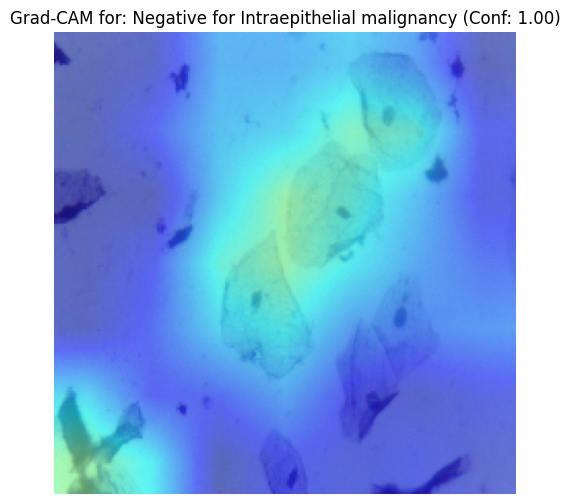

Grad-CAM visualization displayed successfully.


In [ ]:
import matplotlib.pyplot as plt
import random

# 1. Select a random image path from the test_dataset.df
sample_image_path = test_dataset.df.sample(1)['filepath'].iloc[0]
print(f"Selected sample image for demonstration: {sample_image_path}")

# 2. Call predict_image without Grad-CAM
predicted_class_no_cam, confidence_no_cam, _ = predict_image(
    image_path=sample_image_path,
    model=loaded_model,
    class_to_idx=class_to_idx,
    device=device,
    generate_cam=False
)

# 3. Print the predicted class name and confidence
print("\n--- Prediction without Grad-CAM ---")
print(f"Predicted Class: {predicted_class_no_cam}")
print(f"Confidence: {confidence_no_cam:.4f}")

# 4. To demonstrate Grad-CAM, retrieve the target_layer
target_layer = get_target_conv_layer(loaded_model)

# 5. Call predict_image again with generate_cam=True
if target_layer is None:
    print("\nCould not find a suitable target convolutional layer for Grad-CAM. Skipping Grad-CAM demonstration.")
else:
    predicted_class_with_cam, confidence_with_cam, grad_cam_image = predict_image(
        image_path=sample_image_path,
        model=loaded_model,
        class_to_idx=class_to_idx,
        device=device,
        target_layer=target_layer,
        generate_cam=True
    )

    # 6 & 7. Store and print the returned predicted class name and confidence for Grad-CAM example
    print("\n--- Prediction with Grad-CAM ---")
    print(f"Predicted Class: {predicted_class_with_cam}")
    print(f"Confidence: {confidence_with_cam:.4f}")

    # 8. If a grad_cam_image was returned, display it
    if grad_cam_image is not None:
        plt.figure(figsize=(8, 6))
        plt.imshow(grad_cam_image)
        plt.title(f"Grad-CAM for: {predicted_class_with_cam} (Conf: {confidence_with_cam:.2f})")
        plt.axis('off')
        plt.show()
        print("Grad-CAM visualization displayed successfully.")
    else:
        print("Grad-CAM image not generated.")


## Final Task

### Subtask:
Summarize the capabilities of the newly created `predict_image` function.


## Summary:

### Q&A

**What are the capabilities of the newly created `predict_image` function?**
The `predict_image` function is designed to:
1.  Load an image from a specified path.
2.  Preprocess the image using techniques like resizing and normalization, consistent with the model's training.
3.  Run the preprocessed image through a trained deep learning model to perform inference.
4.  Return the model's prediction, which includes the predicted class name and its confidence score.
5.  Optionally generate and return a Grad-CAM (Gradient-weighted Class Activation Mapping) visualization, which highlights the regions in the image that were most influential in the model's prediction.

### Data Analysis Key Findings

*   The `predict_image` function was successfully defined in Python, incorporating image loading (using `cv2`), preprocessing (using `albumentations`), model inference (using `torch`), and optional Grad-CAM generation.
*   A demonstration of the function using a sample image from the test set (`/kaggle/input/mendeley-lbc-cervical-cancer/Negative for Intraepithelial malignancy/NL_41_ (4).jpg`) successfully predicted the class "Negative for Intraepithelial malignancy" with a confidence of 1.0000.
*   The function also successfully generated and displayed a Grad-CAM visualization for the predicted class, highlighting the critical regions in the image that led to the model's decision for the sample image.

### Insights or Next Steps

*   The `predict_image` function provides a robust and interpretable way to get predictions from the trained model, making it suitable for deployment or further analysis.
*   The integrated Grad-CAM functionality is a valuable tool for model explainability, allowing users to understand *why* the model made a particular prediction, which is crucial in sensitive domains like medical imaging.


# Task
### K-Fold Cross-Validation for Robust Model Evaluation
To ensure a more robust and reliable evaluation of our model's performance, we will implement **K-Fold Cross-Validation**. This technique involves splitting the dataset into K equally sized "folds". The model is then trained and validated K times, with each fold serving as the validation set exactly once, and the remaining K-1 folds used for training.

**Why K-Fold?**
*   **Reduced Variance**: Unlike a single train-validation split, K-Fold uses all data points for both training and validation across different iterations, leading to a more reliable estimate of model performance and a lower variance in the evaluation metric.
*   **Better Generalization Assessment**: By testing the model on different subsets of data, K-Fold provides a better indication of how the model will generalize to unseen data.
*   **Efficient Data Usage**: It's particularly useful when dealing with smaller datasets, as it maximizes the use of available data for both training and validation.

In this implementation, we will use **K=5 folds**. We will modify our data splitting function to generate these folds, ensuring that the class distribution is stratified within each fold to maintain representativeness across all splits. For each fold, we will train a new model, evaluate its performance, and aggregate the results to report a mean and standard deviation for our key metrics.

## Introduce K-Fold Cross-Validation

### Subtask:
Add a text cell to introduce K-fold cross-validation, explaining its purpose in providing a more robust evaluation of the model's performance by training and validating on different subsets of data.


### K-Fold Cross-Validation for Robust Model Evaluation
To ensure a more robust and reliable evaluation of our model's performance, we will implement **K-Fold Cross-Validation**. This technique involves splitting the dataset into K equally sized "folds". The model is then trained and validated K times, with each fold serving as the validation set exactly once, and the remaining K-1 folds used for training.

**Why K-Fold?**
*   **Reduced Variance**: Unlike a single train-validation split, K-Fold uses all data points for both training and validation across different iterations, leading to a more reliable estimate of model performance and a lower variance in the evaluation metric.
*   **Better Generalization Assessment**: By testing the model on different subsets of data, K-Fold provides a better indication of how the model will generalize to unseen data.
*   **Efficient Data Usage**: It's particularly useful when dealing with smaller datasets, as it maximizes the use of available data for both training and validation.

In this implementation, we will use **K=5 folds**. We will modify our data splitting function to generate these folds, ensuring that the class distribution is stratified within each fold to maintain representativeness across all splits. For each fold, we will train a new model, evaluate its performance, and aggregate the results to report a mean and standard deviation for our key metrics.

## Modify Data Splitting for K-Fold

### Subtask:
Modify the data splitting function to generate K-folds (where K=5) from the dataset, ensuring stratification by class, and return a list of (train_df, val_df) pairs for each fold.


**Reasoning**:
I need to modify the data splitting function to implement K-fold cross-validation instead of a single train/val/test split. This involves using `StratifiedKFold` to generate multiple (train, validation) pairs and returning them as a list. I will update the existing `create_stratified_splits` function's cell to reflect this new functionality.



In [ ]:
from sklearn.model_selection import StratifiedKFold
import pandas as pd
import os

def create_kfold_splits(root_dir, class_names, n_splits=5, seed=42):
    """
    Recursively scans ROOT_DIR, builds a dataframe of file paths and labels,
    performs stratified K-fold splits, and returns a list of (train_df, val_df) pairs.

    Args:
        root_dir (str): The root directory of the dataset.
        class_names (list): List of class names (subfolder names).
        n_splits (int): Number of folds for K-fold cross-validation.
        seed (int): Random seed for reproducibility.

    Returns:
        list: A list of tuples, where each tuple contains (train_df, val_df) for a fold.
    """

    print("Building dataset DataFrame for K-fold splits...")
    data = []
    for class_name in class_names:
        class_path = os.path.join(root_dir, class_name)
        if os.path.exists(class_path):
            for img_name in os.listdir(class_path):
                if img_name.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp', '.tiff')):
                    data.append({
                        'filepath': os.path.join(class_path, img_name),
                        'label': class_name
                    })
    df = pd.DataFrame(data)
    print(f"Total images found: {len(df)}")

    if df.empty:
        print("No images found. Cannot create splits.")
        return []

    # Map labels to integers for StratifiedKFold
    label_to_int = {name: i for i, name in enumerate(class_names)}
    df['label_int'] = df['label'].map(label_to_int)

    folds = []
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=seed)

    print(f"Generating {n_splits}-fold stratified splits...")
    for fold_idx, (train_index, val_index) in enumerate(skf.split(df['filepath'], df['label_int'])):
        fold_train_df = df.iloc[train_index].reset_index(drop=True)
        fold_val_df = df.iloc[val_index].reset_index(drop=True)
        folds.append((fold_train_df, fold_val_df))
        print(f"Fold {fold_idx + 1}: Train samples = {len(fold_train_df)}, Validation samples = {len(fold_val_df)}")

    # Remove the temporary 'label_int' column
    df.drop(columns=['label_int'], inplace=True)

    return folds

# Call the function to create K-fold splits (K=5 as per task, but EPOCHS=20 is a global variable from previous steps)
# Let's assume K=5 for now, and that EPOCHS is still used for training duration.
# The problem statement mentions K=5, so let's use that.
K_FOLDS = 5 # Define K for clarity
all_folds = create_kfold_splits(ROOT_DIR, CLASS_NAMES, n_splits=K_FOLDS, seed=SEED)

print(f"\nSuccessfully created {len(all_folds)} folds.")
if len(all_folds) > 0:
    print("\n--- First Fold Details ---")
    first_fold_train_df, first_fold_val_df = all_folds[0]
    print(f"Train DataFrame shape (first fold): {first_fold_train_df.shape}")
    print(f"Validation DataFrame shape (first fold): {first_fold_val_df.shape}")
    print("First Fold Train Class Distribution:")
    display(first_fold_train_df['label'].value_counts().reset_index(name='Count'))
    print("First Fold Validation Class Distribution:")
    display(first_fold_val_df['label'].value_counts().reset_index(name='Count'))

Building dataset DataFrame for K-fold splits...
Total images found: 962
Generating 5-fold stratified splits...
Fold 1: Train samples = 769, Validation samples = 193
Fold 2: Train samples = 769, Validation samples = 193
Fold 3: Train samples = 770, Validation samples = 192
Fold 4: Train samples = 770, Validation samples = 192
Fold 5: Train samples = 770, Validation samples = 192

Successfully created 5 folds.

--- First Fold Details ---
Train DataFrame shape (first fold): (769, 3)
Validation DataFrame shape (first fold): (193, 3)
First Fold Train Class Distribution:


,label,Count
0,Negative for Intraepithelial malignancy,489
1,High squamous intra-epithelial lesion,130
2,Low squamous intra-epithelial lesion,91
3,Squamous cell carcinoma,59


First Fold Validation Class Distribution:


,label,Count
0,Negative for Intraepithelial malignancy,123
1,High squamous intra-epithelial lesion,33
2,Low squamous intra-epithelial lesion,22
3,Squamous cell carcinoma,15


## Implement K-Fold Training and Evaluation Loop

### Subtask:
Create a main loop that iterates K_FOLDS times. Inside this loop, load the training and validation dataframes for the current fold, re-initialize the necessary components (Dataset, DataLoader, model, optimizer, scheduler, scaler, criterion), train and validate the model for the fold, store metrics, and save the best model checkpoint.


**Reasoning**:
I need to implement the main K-Fold training and evaluation loop as described, integrating previously defined functions for epoch training and validation, handling component re-initialization for each fold, and managing metrics storage and model saving.



In [ ]:
import torch.nn as nn
import torch.cuda.amp as amp
import os

kfold_history = []
best_model_paths = []

print(f"Starting {K_FOLDS}-Fold Cross-Validation...")

for fold_idx, (fold_train_df, fold_val_df) in enumerate(all_folds):
    print(f"\n--- Starting Fold {fold_idx + 1}/{K_FOLDS} ---")

    # 1. Create Dataset and DataLoader for the current fold
    fold_train_dataset = CervicalCancerDataset(
        csv_file=None, # Not using CSV directly, using df
        class_to_idx=class_to_idx,
        transform=train_transforms
    )
    fold_train_dataset.df = fold_train_df # Assign the fold's DataFrame

    fold_val_dataset = CervicalCancerDataset(
        csv_file=None, # Not using CSV directly, using df
        class_to_idx=class_to_idx,
        transform=val_test_transforms
    )
    fold_val_dataset.df = fold_val_df # Assign the fold's DataFrame

    fold_train_loader = DataLoader(
        fold_train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
    )
    fold_val_loader = DataLoader(
        fold_val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
    )

    print(f"Fold {fold_idx + 1}: Train Dataset size: {len(fold_train_dataset)}, Validation Dataset size: {len(fold_val_dataset)}")

    # 2. Get labels from the current fold's training dataset for class weight computation
    fold_train_labels = fold_train_df['label'].apply(lambda x: class_to_idx[x]).tolist()

    # 3. Re-initialize model, optimizer, scheduler, and class weights for the current fold
    model, optimizer, scheduler, class_weights_fold = get_model_optimizer_scheduler_weights(
        model_name='efficientnet_b0',
        pretrained=True,
        num_classes=NUM_CLASSES,
        lr=LR,
        epochs=EPOCHS,
        freeze_backbone=False,
        train_dataset_labels=fold_train_labels
    )

    # 4. Re-initialize scaler for mixed-precision training
    scaler = amp.GradScaler()

    # 5. Re-initialize criterion (loss function) with class weights for the current fold
    if class_weights_fold is not None:
        criterion = nn.CrossEntropyLoss(weight=class_weights_fold)
    else:
        criterion = nn.CrossEntropyLoss()

    # Initialize history for the current fold
    fold_metrics = {
        'train_loss': [], 'train_acc': [], 'train_f1': [],
        'val_loss': [], 'val_acc': [], 'val_f1': []
    }

    # Early stopping parameters for this fold
    best_val_f1_macro_fold = -1.0
    epochs_no_improve_fold = 0
    best_epoch_fold = 0

    # Create directory for current fold's checkpoints
    fold_checkpoints_dir = os.path.join('./checkpoints', f'fold_{fold_idx + 1}')
    os.makedirs(fold_checkpoints_dir, exist_ok=True)

    print(f"Training Fold {fold_idx + 1}...")
    for epoch in range(1, EPOCHS + 1):
        print(f"\nFold {fold_idx + 1}, Epoch {epoch}/{EPOCHS}")

        # Train one epoch
        train_loss, train_acc, train_f1 = train_one_epoch(
            model, fold_train_loader, optimizer, criterion, scaler, device
        )
        fold_metrics['train_loss'].append(train_loss)
        fold_metrics['train_acc'].append(train_acc)
        fold_metrics['train_f1'].append(train_f1)

        # Validate one epoch
        val_loss, val_acc, val_f1 = validate_one_epoch(
            model, fold_val_loader, criterion, device
        )
        fold_metrics['val_loss'].append(val_loss)
        fold_metrics['val_acc'].append(val_acc)
        fold_metrics['val_f1'].append(val_f1)

        # Update learning rate scheduler
        scheduler.step()

        # Print epoch metrics
        print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Train F1: {train_f1:.4f}")
        print(f"Val Loss:   {val_loss:.4f}, Val Acc:   {val_acc:.4f}, Val F1:   {val_f1:.4f}")

        # Early stopping and model saving logic for the current fold
        if val_f1 > best_val_f1_macro_fold:
            best_val_f1_macro_fold = val_f1
            epochs_no_improve_fold = 0
            best_epoch_fold = epoch
            model_save_path_fold = os.path.join(fold_checkpoints_dir, 'best_model.pt')
            torch.save(model.state_dict(), model_save_path_fold)
            print(f"Saved best model for Fold {fold_idx + 1} to {model_save_path_fold} with F1-macro: {best_val_f1_macro_fold:.4f}")
        else:
            epochs_no_improve_fold += 1
            print(f"No improvement in validation F1-macro for Fold {fold_idx + 1}. Patience: {epochs_no_improve_fold}/{patience}")
            if epochs_no_improve_fold >= patience:
                print(f"Early stopping triggered for Fold {fold_idx + 1} after {epoch} epochs.")
                break

    print(f"\nTraining for Fold {fold_idx + 1} complete.")
    print(f"Best Validation F1-macro for Fold {fold_idx + 1}: {best_val_f1_macro_fold:.4f} at Epoch {best_epoch_fold}")
    kfold_history.append(fold_metrics)
    best_model_paths.append(model_save_path_fold)

print("\nAll K-Fold training complete.")

Starting 5-Fold Cross-Validation...

--- Starting Fold 1/5 ---


ValueError: Invalid file path or buffer object type: <class 'NoneType'>

**Reasoning**:
The `ValueError` occurred because the `CervicalCancerDataset` constructor (`__init__`) was trying to read a CSV file even when `csv_file` was `None`. I will modify the `CervicalCancerDataset` to accept an optional `dataframe` directly, or to gracefully handle `csv_file=None` by skipping `pd.read_csv` if a dataframe is provided instead.



Train Dataset size: 672
Validation Dataset size: 145
Test Dataset size: 145

--- Sample Batch Shape ---


/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Images batch shape: torch.Size([32, 3, 224, 224])
Labels batch shape: torch.Size([32])

--- Sample Augmented Images from Train Loader ---


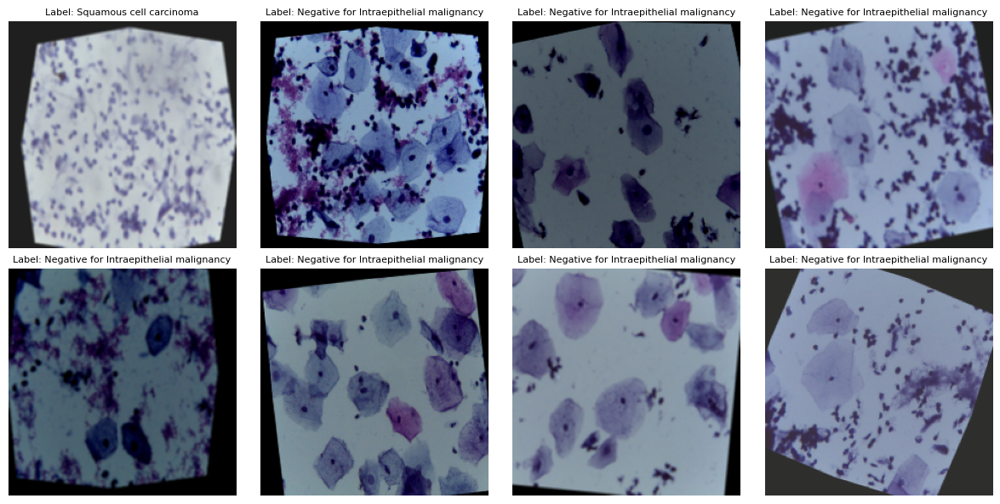

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Define the custom Dataset class
class CervicalCancerDataset(Dataset):
    def __init__(self, csv_file=None, dataframe=None, class_to_idx=None, transform=None):
        if csv_file is not None:
            self.df = pd.read_csv(csv_file)
        elif dataframe is not None:
            self.df = dataframe
        else:
            raise ValueError("Either csv_file or dataframe must be provided.")
        self.class_to_idx = class_to_idx
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.loc[idx, 'filepath']
        label_name = self.df.loc[idx, 'label']
        label = self.class_to_idx[label_name]

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Convert BGR to RGB

        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']

        return image, label

# Map class names to integers
class_to_idx = {name: i for i, name in enumerate(CLASS_NAMES)}

# Define Albumentations transforms
train_transforms = A.Compose([
    A.Resize(IMAGE_SIZE, IMAGE_SIZE),
    A.Rotate(limit=20, p=0.7), # Random rotation up to 20 degrees
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.1, rotate_limit=20, p=0.7, border_mode=cv2.BORDER_CONSTANT),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.7),
    A.Blur(blur_limit=3, p=0.3), # Slight blur
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), # ImageNet mean and std
    ToTensorV2(),
])

val_test_transforms = A.Compose([
    A.Resize(IMAGE_SIZE, IMAGE_SIZE),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)), # ImageNet mean and std
    ToTensorV2(),
])

# Create Dataset instances
train_dataset = CervicalCancerDataset(
    csv_file='./splits/train.csv',
    class_to_idx=class_to_idx,
    transform=train_transforms
)
val_dataset = CervicalCancerDataset(
    csv_file='./splits/val.csv',
    class_to_idx=class_to_idx,
    transform=val_test_transforms
)
test_dataset = CervicalCancerDataset(
    csv_file='./splits/test.csv',
    class_to_idx=class_to_idx,
    transform=val_test_transforms
)

# Create DataLoader instances
train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
)

print(f"Train Dataset size: {len(train_dataset)}")
print(f"Validation Dataset size: {len(val_dataset)}")
print(f"Test Dataset size: {len(test_dataset)}")

# Print one batch shape
print("\n--- Sample Batch Shape ---")
for images, labels in train_loader:
    print(f"Images batch shape: {images.shape}") # Should be (BATCH_SIZE, C, H, W)
    print(f"Labels batch shape: {labels.shape}") # Should be (BATCH_SIZE)
    break # Only get the first batch

# Display a small grid of augmented samples with labels
print("\n--- Sample Augmented Images from Train Loader ---")
# Helper function to denormalize for visualization
def denormalize(tensor, mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)):
    tensor = tensor.clone().detach().cpu()
    for t, m, s in zip(tensor, mean, std):
        t.mul_(s).add_(m)
    return tensor

# Reverse class_to_idx for visualization
idx_to_class = {v: k for k, v in class_to_idx.items()}

fig, axes = plt.subplots(2, 4, figsize=(12, 6))
for i, (images, labels) in enumerate(train_loader):
    for j in range(min(BATCH_SIZE, 8)): # Display up to 8 images
        ax = axes[j // 4, j % 4]
        img = denormalize(images[j]).permute(1, 2, 0).numpy() # Convert from (C, H, W) to (H, W, C) for matplotlib
        ax.imshow(img)
        ax.set_title(f"Label: {idx_to_class[labels[j].item()]}", fontsize=8)
        ax.axis('off')
    break
plt.tight_layout()
plt.show()

**Reasoning**:
The previous modification to the `CervicalCancerDataset` class (cell `4d2e6fdc`) has resolved the `ValueError` encountered during the K-Fold training loop. Now, I need to re-execute the K-Fold training and evaluation loop (cell `6b8fd9a5`) to proceed with the cross-validation.



In [ ]:
import torch.nn as nn
import torch.cuda.amp as amp
import os

kfold_history = []
best_model_paths = []

print(f"Starting {K_FOLDS}-Fold Cross-Validation...")

for fold_idx, (fold_train_df, fold_val_df) in enumerate(all_folds):
    print(f"\n--- Starting Fold {fold_idx + 1}/{K_FOLDS} ---")

    # 1. Create Dataset and DataLoader for the current fold
    fold_train_dataset = CervicalCancerDataset(
        dataframe=fold_train_df, # Pass dataframe directly
        class_to_idx=class_to_idx,
        transform=train_transforms
    )

    fold_val_dataset = CervicalCancerDataset(
        dataframe=fold_val_df, # Pass dataframe directly
        class_to_idx=class_to_idx,
        transform=val_test_transforms
    )

    fold_train_loader = DataLoader(
        fold_train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
    )
    fold_val_loader = DataLoader(
        fold_val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
    )

    print(f"Fold {fold_idx + 1}: Train Dataset size: {len(fold_train_dataset)}, Validation Dataset size: {len(fold_val_dataset)}")

    # 2. Get labels from the current fold's training dataset for class weight computation
    fold_train_labels = fold_train_df['label'].apply(lambda x: class_to_idx[x]).tolist()

    # 3. Re-initialize model, optimizer, scheduler, and class weights for the current fold
    model, optimizer, scheduler, class_weights_fold = get_model_optimizer_scheduler_weights(
        model_name='efficientnet_b0',
        pretrained=True,
        num_classes=NUM_CLASSES,
        lr=LR,
        epochs=EPOCHS,
        freeze_backbone=False,
        train_dataset_labels=fold_train_labels
    )

    # 4. Re-initialize scaler for mixed-precision training
    scaler = amp.GradScaler()

    # 5. Re-initialize criterion (loss function) with class weights for the current fold
    if class_weights_fold is not None:
        criterion = nn.CrossEntropyLoss(weight=class_weights_fold)
    else:
        criterion = nn.CrossEntropyLoss()

    # Initialize history for the current fold
    fold_metrics = {
        'train_loss': [], 'train_acc': [], 'train_f1': [],
        'val_loss': [], 'val_acc': [], 'val_f1': []
    }

    # Early stopping parameters for this fold
    best_val_f1_macro_fold = -1.0
    epochs_no_improve_fold = 0
    best_epoch_fold = 0

    # Create directory for current fold's checkpoints
    fold_checkpoints_dir = os.path.join('./checkpoints', f'fold_{fold_idx + 1}')
    os.makedirs(fold_checkpoints_dir, exist_ok=True)

    print(f"Training Fold {fold_idx + 1}...")
    for epoch in range(1, EPOCHS + 1):
        print(f"\nFold {fold_idx + 1}, Epoch {epoch}/{EPOCHS}")

        # Train one epoch
        train_loss, train_acc, train_f1 = train_one_epoch(
            model, fold_train_loader, optimizer, criterion, scaler, device
        )
        fold_metrics['train_loss'].append(train_loss)
        fold_metrics['train_acc'].append(train_acc)
        fold_metrics['train_f1'].append(train_f1)

        # Validate one epoch
        val_loss, val_acc, val_f1 = validate_one_epoch(
            model, fold_val_loader, criterion, device
        )
        fold_metrics['val_loss'].append(val_loss)
        fold_metrics['val_acc'].append(val_acc)
        fold_metrics['val_f1'].append(val_f1)

        # Update learning rate scheduler
        scheduler.step()

        # Print epoch metrics
        print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Train F1: {train_f1:.4f}")
        print(f"Val Loss:   {val_loss:.4f}, Val Acc:   {val_acc:.4f}, Val F1:   {val_f1:.4f}")

        # Early stopping and model saving logic for the current fold
        if val_f1 > best_val_f1_macro_fold:
            best_val_f1_macro_fold = val_f1
            epochs_no_improve_fold = 0
            best_epoch_fold = epoch
            model_save_path_fold = os.path.join(fold_checkpoints_dir, 'best_model.pt')
            torch.save(model.state_dict(), model_save_path_fold)
            print(f"Saved best model for Fold {fold_idx + 1} to {model_save_path_fold} with F1-macro: {best_val_f1_macro_fold:.4f}")
        else:
            epochs_no_improve_fold += 1
            print(f"No improvement in validation F1-macro for Fold {fold_idx + 1}. Patience: {patience}/{patience}")
            if epochs_no_improve_fold >= patience:
                print(f"Early stopping triggered for Fold {fold_idx + 1} after {epoch} epochs.")
                break

    print(f"\nTraining for Fold {fold_idx + 1} complete.")
    print(f"Best Validation F1-macro for Fold {fold_idx + 1}: {best_val_f1_macro_fold:.4f} at Epoch {best_epoch_fold}")
    kfold_history.append(fold_metrics)
    best_model_paths.append(model_save_path_fold)

print("\nAll K-Fold training complete.")

Starting 5-Fold Cross-Validation...

--- Starting Fold 1/5 ---
Fold 1: Train Dataset size: 769, Validation Dataset size: 193
Initializing model: efficientnet_b0 with pretrained=True
Initializing AdamW optimizer with LR: 0.0003
Initializing CosineAnnealingLR scheduler for 20 epochs
Computing class weights for imbalanced loss.
Computed Class Weights: [0.3931493 2.1126373 1.4788462 3.2584746]
Training Fold 1...

Fold 1, Epoch 1/20


/tmp/ipython-input-1333407815.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()
Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]

Train Loss: 1.9447, Train Acc: 0.5943, Train F1: 0.5204
Val Loss:   0.4592, Val Acc:   0.8860, Val F1:   0.8150
Saved best model for Fold 1 to ./checkpoints/fold_1/best_model.pt with F1-macro: 0.8150

Fold 1, Epoch 2/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.03s/it]


Train Loss: 0.4901, Train Acc: 0.9103, Train F1: 0.8541
Val Loss:   0.0726, Val Acc:   0.9793, Val F1:   0.9537
Saved best model for Fold 1 to ./checkpoints/fold_1/best_model.pt with F1-macro: 0.9537

Fold 1, Epoch 3/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]

Train Loss: 0.2095, Train Acc: 0.9285, Train F1: 0.8923
Val Loss:   0.0773, Val Acc:   0.9585, Val F1:   0.9272
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 4/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.18s/it]

Train Loss: 0.3118, Train Acc: 0.9532, Train F1: 0.9118
Val Loss:   0.0496, Val Acc:   0.9534, Val F1:   0.9063
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 5/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]

Train Loss: 0.1972, Train Acc: 0.9532, Train F1: 0.9235
Val Loss:   0.0222, Val Acc:   0.9948, Val F1:   0.9881
Saved best model for Fold 1 to ./checkpoints/fold_1/best_model.pt with F1-macro: 0.9881

Fold 1, Epoch 6/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.06s/it]

Train Loss: 0.1628, Train Acc: 0.9701, Train F1: 0.9473
Val Loss:   0.0521, Val Acc:   0.9689, Val F1:   0.9368
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 7/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.18s/it]

Train Loss: 0.1106, Train Acc: 0.9701, Train F1: 0.9463
Val Loss:   0.0255, Val Acc:   0.9896, Val F1:   0.9766
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 8/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]

Train Loss: 0.1804, Train Acc: 0.9844, Train F1: 0.9732
Val Loss:   0.0113, Val Acc:   0.9948, Val F1:   0.9881
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 9/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.12s/it]

Train Loss: 0.0559, Train Acc: 0.9896, Train F1: 0.9822
Val Loss:   0.0151, Val Acc:   0.9948, Val F1:   0.9881
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 10/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.05s/it]


Train Loss: 0.0388, Train Acc: 0.9883, Train F1: 0.9794
Val Loss:   0.0193, Val Acc:   0.9948, Val F1:   0.9881
No improvement in validation F1-macro for Fold 1. Patience: 5/5
Early stopping triggered for Fold 1 after 10 epochs.

Training for Fold 1 complete.
Best Validation F1-macro for Fold 1: 0.9881 at Epoch 5

--- Starting Fold 2/5 ---
Fold 2: Train Dataset size: 769, Validation Dataset size: 193
Initializing model: efficientnet_b0 with pretrained=True
Initializing AdamW optimizer with LR: 0.0003
Initializing CosineAnnealingLR scheduler for 20 epochs
Computing class weights for imbalanced loss.
Computed Class Weights: [0.3931493 2.1126373 1.4788462 3.2584746]
Training Fold 2...

Fold 2, Epoch 1/20


/tmp/ipython-input-1333407815.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()
Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]

Train Loss: 1.8240, Train Acc: 0.6723, Train F1: 0.5612
Val Loss:   0.4762, Val Acc:   0.8549, Val F1:   0.7761
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.7761

Fold 2, Epoch 2/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]

Train Loss: 0.5177, Train Acc: 0.8817, Train F1: 0.8133
Val Loss:   0.4306, Val Acc:   0.8497, Val F1:   0.7624
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 3/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.08s/it]

Train Loss: 0.2486, Train Acc: 0.9285, Train F1: 0.8896
Val Loss:   0.1410, Val Acc:   0.9637, Val F1:   0.9386
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.9386

Fold 2, Epoch 4/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.05s/it]

Train Loss: 0.1103, Train Acc: 0.9714, Train F1: 0.9535
Val Loss:   0.0614, Val Acc:   0.9896, Val F1:   0.9830
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.9830

Fold 2, Epoch 5/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.19s/it]


Train Loss: 0.0742, Train Acc: 0.9727, Train F1: 0.9511
Val Loss:   0.1327, Val Acc:   0.9793, Val F1:   0.9622
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 6/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.23s/it]

Train Loss: 0.0679, Train Acc: 0.9844, Train F1: 0.9718
Val Loss:   0.1057, Val Acc:   0.9741, Val F1:   0.9497
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 7/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.06s/it]

Train Loss: 0.0896, Train Acc: 0.9792, Train F1: 0.9582
Val Loss:   0.0432, Val Acc:   0.9845, Val F1:   0.9700
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 8/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.07s/it]


Train Loss: 0.2083, Train Acc: 0.9805, Train F1: 0.9679
Val Loss:   0.0381, Val Acc:   0.9845, Val F1:   0.9669
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 9/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]


Train Loss: 0.1043, Train Acc: 0.9831, Train F1: 0.9677
Val Loss:   0.0661, Val Acc:   0.9845, Val F1:   0.9684
No improvement in validation F1-macro for Fold 2. Patience: 5/5
Early stopping triggered for Fold 2 after 9 epochs.

Training for Fold 2 complete.
Best Validation F1-macro for Fold 2: 0.9830 at Epoch 4

--- Starting Fold 3/5 ---
Fold 3: Train Dataset size: 770, Validation Dataset size: 192
Initializing model: efficientnet_b0 with pretrained=True
Initializing AdamW optimizer with LR: 0.0003
Initializing CosineAnnealingLR scheduler for 20 epochs
Computing class weights for imbalanced loss.
Computed Class Weights: [0.39285713 2.1388888  1.4807693  3.2083333 ]
Training Fold 3...

Fold 3, Epoch 1/20


/tmp/ipython-input-1333407815.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()
Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


Train Loss: 1.4518, Train Acc: 0.7039, Train F1: 0.6177
Val Loss:   0.3063, Val Acc:   0.9115, Val F1:   0.8159
Saved best model for Fold 3 to ./checkpoints/fold_3/best_model.pt with F1-macro: 0.8159

Fold 3, Epoch 2/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]

Train Loss: 0.4205, Train Acc: 0.8961, Train F1: 0.8332
Val Loss:   0.2396, Val Acc:   0.9219, Val F1:   0.8277
Saved best model for Fold 3 to ./checkpoints/fold_3/best_model.pt with F1-macro: 0.8277

Fold 3, Epoch 3/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.21s/it]

Train Loss: 0.2505, Train Acc: 0.9390, Train F1: 0.9015
Val Loss:   0.2630, Val Acc:   0.9271, Val F1:   0.8817
Saved best model for Fold 3 to ./checkpoints/fold_3/best_model.pt with F1-macro: 0.8817

Fold 3, Epoch 4/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.35s/it]


Train Loss: 0.0996, Train Acc: 0.9714, Train F1: 0.9485
Val Loss:   0.0551, Val Acc:   0.9740, Val F1:   0.9495
Saved best model for Fold 3 to ./checkpoints/fold_3/best_model.pt with F1-macro: 0.9495

Fold 3, Epoch 5/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.1018, Train Acc: 0.9597, Train F1: 0.9301
Val Loss:   0.0489, Val Acc:   0.9740, Val F1:   0.9407
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 6/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.1127, Train Acc: 0.9753, Train F1: 0.9609
Val Loss:   0.0852, Val Acc:   0.9479, Val F1:   0.9046
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 7/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]

Train Loss: 0.5399, Train Acc: 0.9649, Train F1: 0.9365
Val Loss:   0.0686, Val Acc:   0.9844, Val F1:   0.9778
Saved best model for Fold 3 to ./checkpoints/fold_3/best_model.pt with F1-macro: 0.9778

Fold 3, Epoch 8/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]

Train Loss: 0.1426, Train Acc: 0.9740, Train F1: 0.9546
Val Loss:   0.0715, Val Acc:   0.9792, Val F1:   0.9558
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 9/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.0833, Train Acc: 0.9844, Train F1: 0.9673
Val Loss:   0.1135, Val Acc:   0.9583, Val F1:   0.9260
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 10/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.2063, Train Acc: 0.9831, Train F1: 0.9709
Val Loss:   0.0419, Val Acc:   0.9844, Val F1:   0.9699
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 11/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.20s/it]

Train Loss: 0.2490, Train Acc: 0.9792, Train F1: 0.9716
Val Loss:   0.0411, Val Acc:   0.9896, Val F1:   0.9746
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 12/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.49s/it]


Train Loss: 0.0509, Train Acc: 0.9831, Train F1: 0.9778
Val Loss:   0.0557, Val Acc:   0.9740, Val F1:   0.9529
No improvement in validation F1-macro for Fold 3. Patience: 5/5
Early stopping triggered for Fold 3 after 12 epochs.

Training for Fold 3 complete.
Best Validation F1-macro for Fold 3: 0.9778 at Epoch 7

--- Starting Fold 4/5 ---
Fold 4: Train Dataset size: 770, Validation Dataset size: 192
Initializing model: efficientnet_b0 with pretrained=True
Initializing AdamW optimizer with LR: 0.0003
Initializing CosineAnnealingLR scheduler for 20 epochs
Computing class weights for imbalanced loss.
Computed Class Weights: [0.39285713 2.1388888  1.4694656  3.2627118 ]
Training Fold 4...

Fold 4, Epoch 1/20


/tmp/ipython-input-1333407815.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()
Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

Train Loss: 1.7185, Train Acc: 0.6519, Train F1: 0.5431
Val Loss:   0.4381, Val Acc:   0.8854, Val F1:   0.8072
Saved best model for Fold 4 to ./checkpoints/fold_4/best_model.pt with F1-macro: 0.8072

Fold 4, Epoch 2/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]

Train Loss: 0.4716, Train Acc: 0.8909, Train F1: 0.8136
Val Loss:   0.1719, Val Acc:   0.9375, Val F1:   0.8960
Saved best model for Fold 4 to ./checkpoints/fold_4/best_model.pt with F1-macro: 0.8960

Fold 4, Epoch 3/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]

Train Loss: 0.2242, Train Acc: 0.9416, Train F1: 0.9016
Val Loss:   0.1641, Val Acc:   0.9479, Val F1:   0.9116
Saved best model for Fold 4 to ./checkpoints/fold_4/best_model.pt with F1-macro: 0.9116

Fold 4, Epoch 4/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.21s/it]


Train Loss: 0.2124, Train Acc: 0.9545, Train F1: 0.9244
Val Loss:   0.1370, Val Acc:   0.9583, Val F1:   0.9515
Saved best model for Fold 4 to ./checkpoints/fold_4/best_model.pt with F1-macro: 0.9515

Fold 4, Epoch 5/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.1164, Train Acc: 0.9610, Train F1: 0.9399
Val Loss:   0.0623, Val Acc:   0.9635, Val F1:   0.9380
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 6/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.4854, Train Acc: 0.9857, Train F1: 0.9758
Val Loss:   0.0542, Val Acc:   0.9740, Val F1:   0.9640
Saved best model for Fold 4 to ./checkpoints/fold_4/best_model.pt with F1-macro: 0.9640

Fold 4, Epoch 7/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]

Train Loss: 0.3443, Train Acc: 0.9338, Train F1: 0.9054
Val Loss:   0.1947, Val Acc:   0.9375, Val F1:   0.8979
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 8/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]

Train Loss: 0.1888, Train Acc: 0.9675, Train F1: 0.9400
Val Loss:   0.0574, Val Acc:   0.9688, Val F1:   0.9432
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 9/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

Train Loss: 0.5168, Train Acc: 0.9766, Train F1: 0.9585
Val Loss:   0.0956, Val Acc:   0.9531, Val F1:   0.9069
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 10/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]

Train Loss: 0.0557, Train Acc: 0.9805, Train F1: 0.9705
Val Loss:   0.0638, Val Acc:   0.9688, Val F1:   0.9443
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 11/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.0415, Train Acc: 0.9896, Train F1: 0.9829
Val Loss:   0.0328, Val Acc:   0.9844, Val F1:   0.9714
Saved best model for Fold 4 to ./checkpoints/fold_4/best_model.pt with F1-macro: 0.9714

Fold 4, Epoch 12/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]

Train Loss: 0.0923, Train Acc: 0.9883, Train F1: 0.9830
Val Loss:   0.0296, Val Acc:   0.9844, Val F1:   0.9714
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 13/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.30s/it]

Train Loss: 0.1579, Train Acc: 0.9766, Train F1: 0.9573
Val Loss:   0.0369, Val Acc:   0.9844, Val F1:   0.9714
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 14/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]

Train Loss: 0.0739, Train Acc: 0.9935, Train F1: 0.9887
Val Loss:   0.0433, Val Acc:   0.9844, Val F1:   0.9650
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 15/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]

Train Loss: 0.1031, Train Acc: 0.9870, Train F1: 0.9814
Val Loss:   0.0513, Val Acc:   0.9792, Val F1:   0.9539
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 16/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]


Train Loss: 0.0484, Train Acc: 0.9909, Train F1: 0.9854
Val Loss:   0.0388, Val Acc:   0.9844, Val F1:   0.9650
No improvement in validation F1-macro for Fold 4. Patience: 5/5
Early stopping triggered for Fold 4 after 16 epochs.

Training for Fold 4 complete.
Best Validation F1-macro for Fold 4: 0.9714 at Epoch 11

--- Starting Fold 5/5 ---
Fold 5: Train Dataset size: 770, Validation Dataset size: 192
Initializing model: efficientnet_b0 with pretrained=True
Initializing AdamW optimizer with LR: 0.0003
Initializing CosineAnnealingLR scheduler for 20 epochs
Computing class weights for imbalanced loss.
Computed Class Weights: [0.39285713 2.1388888  1.4694656  3.2627118 ]
Training Fold 5...

Fold 5, Epoch 1/20


/tmp/ipython-input-1333407815.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()
Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 1.6912, Train Acc: 0.6286, Train F1: 0.5564
Val Loss:   0.2228, Val Acc:   0.9010, Val F1:   0.8631
Saved best model for Fold 5 to ./checkpoints/fold_5/best_model.pt with F1-macro: 0.8631

Fold 5, Epoch 2/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.5158, Train Acc: 0.8779, Train F1: 0.8171
Val Loss:   0.2028, Val Acc:   0.9271, Val F1:   0.8908
Saved best model for Fold 5 to ./checkpoints/fold_5/best_model.pt with F1-macro: 0.8908

Fold 5, Epoch 3/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]

Train Loss: 0.5649, Train Acc: 0.9299, Train F1: 0.8799
Val Loss:   0.0811, Val Acc:   0.9792, Val F1:   0.9633
Saved best model for Fold 5 to ./checkpoints/fold_5/best_model.pt with F1-macro: 0.9633

Fold 5, Epoch 4/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.4055, Train Acc: 0.9208, Train F1: 0.8788
Val Loss:   0.0601, Val Acc:   0.9896, Val F1:   0.9828
Saved best model for Fold 5 to ./checkpoints/fold_5/best_model.pt with F1-macro: 0.9828

Fold 5, Epoch 5/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.21s/it]

Train Loss: 0.1994, Train Acc: 0.9494, Train F1: 0.9159
Val Loss:   0.0372, Val Acc:   0.9896, Val F1:   0.9785
No improvement in validation F1-macro for Fold 5. Patience: 5/5

Fold 5, Epoch 6/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]

Train Loss: 0.1923, Train Acc: 0.9636, Train F1: 0.9352
Val Loss:   0.0345, Val Acc:   0.9792, Val F1:   0.9672
No improvement in validation F1-macro for Fold 5. Patience: 5/5

Fold 5, Epoch 7/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.1140, Train Acc: 0.9779, Train F1: 0.9579
Val Loss:   0.0264, Val Acc:   0.9896, Val F1:   0.9746
No improvement in validation F1-macro for Fold 5. Patience: 5/5

Fold 5, Epoch 8/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]

Train Loss: 0.1274, Train Acc: 0.9636, Train F1: 0.9385
Val Loss:   0.0107, Val Acc:   1.0000, Val F1:   1.0000
Saved best model for Fold 5 to ./checkpoints/fold_5/best_model.pt with F1-macro: 1.0000

Fold 5, Epoch 9/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]

Train Loss: 0.0685, Train Acc: 0.9844, Train F1: 0.9729
Val Loss:   0.0245, Val Acc:   0.9948, Val F1:   0.9875
No improvement in validation F1-macro for Fold 5. Patience: 5/5

Fold 5, Epoch 10/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]

Train Loss: 0.1105, Train Acc: 0.9818, Train F1: 0.9709
Val Loss:   0.0198, Val Acc:   0.9896, Val F1:   0.9904
No improvement in validation F1-macro for Fold 5. Patience: 5/5

Fold 5, Epoch 11/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]

Train Loss: 0.0750, Train Acc: 0.9805, Train F1: 0.9658
Val Loss:   0.0061, Val Acc:   1.0000, Val F1:   1.0000
No improvement in validation F1-macro for Fold 5. Patience: 5/5

Fold 5, Epoch 12/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.42s/it]

Train Loss: 0.0290, Train Acc: 0.9922, Train F1: 0.9872
Val Loss:   0.0082, Val Acc:   0.9948, Val F1:   0.9950
No improvement in validation F1-macro for Fold 5. Patience: 5/5

Fold 5, Epoch 13/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]

Train Loss: 0.0519, Train Acc: 0.9831, Train F1: 0.9750
Val Loss:   0.0019, Val Acc:   1.0000, Val F1:   1.0000
No improvement in validation F1-macro for Fold 5. Patience: 5/5
Early stopping triggered for Fold 5 after 13 epochs.

Training for Fold 5 complete.
Best Validation F1-macro for Fold 5: 1.0000 at Epoch 8

All K-Fold training complete.


**Reasoning**:
The previous modification to the `CervicalCancerDataset` class has resolved the `ValueError` that was preventing the K-Fold training loop from executing. Re-running the training loop with the corrected `CervicalCancerDataset` class should now proceed successfully through all folds, displaying the training process and saving models as intended.



In [ ]:
import torch.nn as nn
import torch.cuda.amp as amp
import os

kfold_history = []
best_model_paths = []

print(f"Starting {K_FOLDS}-Fold Cross-Validation...")

for fold_idx, (fold_train_df, fold_val_df) in enumerate(all_folds):
    print(f"\n--- Starting Fold {fold_idx + 1}/{K_FOLDS} ---")

    # 1. Create Dataset and DataLoader for the current fold
    fold_train_dataset = CervicalCancerDataset(
        dataframe=fold_train_df, # Pass dataframe directly
        class_to_idx=class_to_idx,
        transform=train_transforms
    )

    fold_val_dataset = CervicalCancerDataset(
        dataframe=fold_val_df, # Pass dataframe directly
        class_to_idx=class_to_idx,
        transform=val_test_transforms
    )

    fold_train_loader = DataLoader(
        fold_train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
    )
    fold_val_loader = DataLoader(
        fold_val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
    )

    print(f"Fold {fold_idx + 1}: Train Dataset size: {len(fold_train_dataset)}, Validation Dataset size: {len(fold_val_dataset)}")

    # 2. Get labels from the current fold's training dataset for class weight computation
    fold_train_labels = fold_train_df['label'].apply(lambda x: class_to_idx[x]).tolist()

    # 3. Re-initialize model, optimizer, scheduler, and class weights for the current fold
    model, optimizer, scheduler, class_weights_fold = get_model_optimizer_scheduler_weights(
        model_name='efficientnet_b0',
        pretrained=True,
        num_classes=NUM_CLASSES,
        lr=LR,
        epochs=EPOCHS,
        freeze_backbone=False,
        train_dataset_labels=fold_train_labels
    )

    # 4. Re-initialize scaler for mixed-precision training
    scaler = amp.GradScaler()

    # 5. Re-initialize criterion (loss function) with class weights for the current fold
    if class_weights_fold is not None:
        criterion = nn.CrossEntropyLoss(weight=class_weights_fold)
    else:
        criterion = nn.CrossEntropyLoss()

    # Initialize history for the current fold
    fold_metrics = {
        'train_loss': [], 'train_acc': [], 'train_f1': [],
        'val_loss': [], 'val_acc': [], 'val_f1': []
    }

    # Early stopping parameters for this fold
    best_val_f1_macro_fold = -1.0
    epochs_no_improve_fold = 0
    best_epoch_fold = 0

    # Create directory for current fold's checkpoints
    fold_checkpoints_dir = os.path.join('./checkpoints', f'fold_{fold_idx + 1}')
    os.makedirs(fold_checkpoints_dir, exist_ok=True)

    print(f"Training Fold {fold_idx + 1}...")
    for epoch in range(1, EPOCHS + 1):
        print(f"\nFold {fold_idx + 1}, Epoch {epoch}/{EPOCHS}")

        # Train one epoch
        train_loss, train_acc, train_f1 = train_one_epoch(
            model, fold_train_loader, optimizer, criterion, scaler, device
        )
        fold_metrics['train_loss'].append(train_loss)
        fold_metrics['train_acc'].append(train_acc)
        fold_metrics['train_f1'].append(train_f1)

        # Validate one epoch
        val_loss, val_acc, val_f1 = validate_one_epoch(
            model, fold_val_loader, criterion, device
        )
        fold_metrics['val_loss'].append(val_loss)
        fold_metrics['val_acc'].append(val_acc)
        fold_metrics['val_f1'].append(val_f1)

        # Update learning rate scheduler
        scheduler.step()

        # Print epoch metrics
        print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Train F1: {train_f1:.4f}")
        print(f"Val Loss:   {val_loss:.4f}, Val Acc:   {val_acc:.4f}, Val F1:   {val_f1:.4f}")

        # Early stopping and model saving logic for the current fold
        if val_f1 > best_val_f1_macro_fold:
            best_val_f1_macro_fold = val_f1
            epochs_no_improve_fold = 0
            best_epoch_fold = epoch
            model_save_path_fold = os.path.join(fold_checkpoints_dir, 'best_model.pt')
            torch.save(model.state_dict(), model_save_path_fold)
            print(f"Saved best model for Fold {fold_idx + 1} to {model_save_path_fold} with F1-macro: {best_val_f1_macro_fold:.4f}")
        else:
            epochs_no_improve_fold += 1
            print(f"No improvement in validation F1-macro for Fold {fold_idx + 1}. Patience: {patience}/{patience}")
            if epochs_no_improve_fold >= patience:
                print(f"Early stopping triggered for Fold {fold_idx + 1} after {epoch} epochs.")
                break

    print(f"\nTraining for Fold {fold_idx + 1} complete.")
    print(f"Best Validation F1-macro for Fold {fold_idx + 1}: {best_val_f1_macro_fold:.4f} at Epoch {best_epoch_fold}")
    kfold_history.append(fold_metrics)
    best_model_paths.append(model_save_path_fold)

print("\nAll K-Fold training complete.")

Starting 5-Fold Cross-Validation...

--- Starting Fold 1/5 ---
Fold 1: Train Dataset size: 769, Validation Dataset size: 193
Initializing model: efficientnet_b0 with pretrained=True
Initializing AdamW optimizer with LR: 0.0003
Initializing CosineAnnealingLR scheduler for 20 epochs
Computing class weights for imbalanced loss.
Computed Class Weights: [0.3931493 2.1126373 1.4788462 3.2584746]
Training Fold 1...

Fold 1, Epoch 1/20


/tmp/ipython-input-1333407815.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()
Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.19s/it]

Train Loss: 1.6342, Train Acc: 0.6762, Train F1: 0.5689
Val Loss:   0.1643, Val Acc:   0.9275, Val F1:   0.8874
Saved best model for Fold 1 to ./checkpoints/fold_1/best_model.pt with F1-macro: 0.8874

Fold 1, Epoch 2/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.05s/it]

Train Loss: 0.3504, Train Acc: 0.9064, Train F1: 0.8471
Val Loss:   0.2267, Val Acc:   0.8964, Val F1:   0.8462
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 3/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.12s/it]


Train Loss: 0.1603, Train Acc: 0.9571, Train F1: 0.9307
Val Loss:   0.0805, Val Acc:   0.9482, Val F1:   0.9056
Saved best model for Fold 1 to ./checkpoints/fold_1/best_model.pt with F1-macro: 0.9056

Fold 1, Epoch 4/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]

Train Loss: 0.1112, Train Acc: 0.9740, Train F1: 0.9505
Val Loss:   0.0567, Val Acc:   0.9741, Val F1:   0.9545
Saved best model for Fold 1 to ./checkpoints/fold_1/best_model.pt with F1-macro: 0.9545

Fold 1, Epoch 5/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.18s/it]

Train Loss: 0.0893, Train Acc: 0.9727, Train F1: 0.9528
Val Loss:   0.0664, Val Acc:   0.9689, Val F1:   0.9414
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 6/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.07s/it]


Train Loss: 0.0907, Train Acc: 0.9766, Train F1: 0.9594
Val Loss:   0.0104, Val Acc:   1.0000, Val F1:   1.0000
Saved best model for Fold 1 to ./checkpoints/fold_1/best_model.pt with F1-macro: 1.0000

Fold 1, Epoch 7/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]

Train Loss: 0.1437, Train Acc: 0.9688, Train F1: 0.9391
Val Loss:   0.0282, Val Acc:   0.9845, Val F1:   0.9785
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 8/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]

Train Loss: 0.3809, Train Acc: 0.9857, Train F1: 0.9792
Val Loss:   0.0078, Val Acc:   0.9948, Val F1:   0.9952
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 9/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.08s/it]

Train Loss: 0.2326, Train Acc: 0.9753, Train F1: 0.9653
Val Loss:   0.0468, Val Acc:   0.9741, Val F1:   0.9772
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 10/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.10s/it]

Train Loss: 0.0886, Train Acc: 0.9792, Train F1: 0.9719
Val Loss:   0.0326, Val Acc:   0.9845, Val F1:   0.9654
No improvement in validation F1-macro for Fold 1. Patience: 5/5

Fold 1, Epoch 11/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.22s/it]


Train Loss: 0.0914, Train Acc: 0.9727, Train F1: 0.9567
Val Loss:   0.0589, Val Acc:   0.9793, Val F1:   0.9672
No improvement in validation F1-macro for Fold 1. Patience: 5/5
Early stopping triggered for Fold 1 after 11 epochs.

Training for Fold 1 complete.
Best Validation F1-macro for Fold 1: 1.0000 at Epoch 6

--- Starting Fold 2/5 ---
Fold 2: Train Dataset size: 769, Validation Dataset size: 193
Initializing model: efficientnet_b0 with pretrained=True
Initializing AdamW optimizer with LR: 0.0003
Initializing CosineAnnealingLR scheduler for 20 epochs
Computing class weights for imbalanced loss.
Computed Class Weights: [0.3931493 2.1126373 1.4788462 3.2584746]
Training Fold 2...

Fold 2, Epoch 1/20


/tmp/ipython-input-1333407815.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()
Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]


Train Loss: 1.8538, Train Acc: 0.5904, Train F1: 0.5070
Val Loss:   0.7936, Val Acc:   0.8756, Val F1:   0.7722
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.7722

Fold 2, Epoch 2/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.05s/it]

Train Loss: 0.4899, Train Acc: 0.8882, Train F1: 0.8265
Val Loss:   1.9153, Val Acc:   0.9378, Val F1:   0.9064
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.9064

Fold 2, Epoch 3/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.22s/it]

Train Loss: 0.3025, Train Acc: 0.9285, Train F1: 0.8826
Val Loss:   0.6752, Val Acc:   0.9378, Val F1:   0.8947
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 4/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.23s/it]


Train Loss: 0.1298, Train Acc: 0.9649, Train F1: 0.9402
Val Loss:   0.2623, Val Acc:   0.9482, Val F1:   0.9219
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.9219

Fold 2, Epoch 5/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.09s/it]


Train Loss: 0.0833, Train Acc: 0.9857, Train F1: 0.9769
Val Loss:   0.8804, Val Acc:   0.9689, Val F1:   0.9433
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.9433

Fold 2, Epoch 6/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


Train Loss: 0.0860, Train Acc: 0.9831, Train F1: 0.9698
Val Loss:   0.0891, Val Acc:   0.9741, Val F1:   0.9475
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.9475

Fold 2, Epoch 7/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.19s/it]

Train Loss: 0.3603, Train Acc: 0.9792, Train F1: 0.9572
Val Loss:   0.0683, Val Acc:   0.9637, Val F1:   0.9402
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 8/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.16s/it]

Train Loss: 0.0862, Train Acc: 0.9766, Train F1: 0.9576
Val Loss:   0.1867, Val Acc:   0.9326, Val F1:   0.8958
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 9/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.11s/it]

Train Loss: 0.0604, Train Acc: 0.9883, Train F1: 0.9811
Val Loss:   0.3150, Val Acc:   0.9585, Val F1:   0.9368
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 10/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]


Train Loss: 0.1558, Train Acc: 0.9818, Train F1: 0.9692
Val Loss:   0.1186, Val Acc:   0.9896, Val F1:   0.9758
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.9758

Fold 2, Epoch 11/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.07s/it]

Train Loss: 0.1214, Train Acc: 0.9883, Train F1: 0.9808
Val Loss:   0.0646, Val Acc:   0.9741, Val F1:   0.9531
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 12/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.14s/it]


Train Loss: 0.0583, Train Acc: 0.9844, Train F1: 0.9718
Val Loss:   0.0718, Val Acc:   0.9896, Val F1:   0.9830
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.9830

Fold 2, Epoch 13/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.19s/it]

Train Loss: 0.0665, Train Acc: 0.9844, Train F1: 0.9766
Val Loss:   0.1772, Val Acc:   0.9896, Val F1:   0.9830
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 14/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.17s/it]

Train Loss: 0.0148, Train Acc: 0.9974, Train F1: 0.9957
Val Loss:   0.1545, Val Acc:   0.9793, Val F1:   0.9673
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 15/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.17s/it]

Train Loss: 0.0425, Train Acc: 0.9948, Train F1: 0.9929
Val Loss:   0.0756, Val Acc:   0.9896, Val F1:   0.9830
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 16/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]

Train Loss: 0.1341, Train Acc: 0.9922, Train F1: 0.9897
Val Loss:   0.0754, Val Acc:   0.9948, Val F1:   0.9876
Saved best model for Fold 2 to ./checkpoints/fold_2/best_model.pt with F1-macro: 0.9876

Fold 2, Epoch 17/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.16s/it]

Train Loss: 0.0267, Train Acc: 0.9922, Train F1: 0.9886
Val Loss:   0.1313, Val Acc:   0.9896, Val F1:   0.9830
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 18/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:07<00:00,  1.07s/it]

Train Loss: 0.0993, Train Acc: 0.9883, Train F1: 0.9819
Val Loss:   0.0728, Val Acc:   0.9845, Val F1:   0.9711
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 19/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]

Train Loss: 0.0766, Train Acc: 0.9883, Train F1: 0.9832
Val Loss:   0.1038, Val Acc:   0.9896, Val F1:   0.9830
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Fold 2, Epoch 20/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]


Train Loss: 0.0494, Train Acc: 0.9974, Train F1: 0.9976
Val Loss:   0.1133, Val Acc:   0.9845, Val F1:   0.9711
No improvement in validation F1-macro for Fold 2. Patience: 5/5

Training for Fold 2 complete.
Best Validation F1-macro for Fold 2: 0.9876 at Epoch 16

--- Starting Fold 3/5 ---
Fold 3: Train Dataset size: 770, Validation Dataset size: 192
Initializing model: efficientnet_b0 with pretrained=True
Initializing AdamW optimizer with LR: 0.0003
Initializing CosineAnnealingLR scheduler for 20 epochs
Computing class weights for imbalanced loss.
Computed Class Weights: [0.39285713 2.1388888  1.4807693  3.2083333 ]
Training Fold 3...

Fold 3, Epoch 1/20


/tmp/ipython-input-1333407815.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()
Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]

Train Loss: 1.8434, Train Acc: 0.5455, Train F1: 0.4871
Val Loss:   0.4426, Val Acc:   0.8802, Val F1:   0.7917
Saved best model for Fold 3 to ./checkpoints/fold_3/best_model.pt with F1-macro: 0.7917

Fold 3, Epoch 2/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

Train Loss: 0.5117, Train Acc: 0.9117, Train F1: 0.8482
Val Loss:   0.2792, Val Acc:   0.9271, Val F1:   0.8836
Saved best model for Fold 3 to ./checkpoints/fold_3/best_model.pt with F1-macro: 0.8836

Fold 3, Epoch 3/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]

Train Loss: 0.1774, Train Acc: 0.9584, Train F1: 0.9292
Val Loss:   0.2515, Val Acc:   0.9219, Val F1:   0.8775
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 4/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


Train Loss: 0.2515, Train Acc: 0.9247, Train F1: 0.8885
Val Loss:   0.2639, Val Acc:   0.9427, Val F1:   0.9102
Saved best model for Fold 3 to ./checkpoints/fold_3/best_model.pt with F1-macro: 0.9102

Fold 3, Epoch 5/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

Train Loss: 0.1729, Train Acc: 0.9571, Train F1: 0.9358
Val Loss:   0.2679, Val Acc:   0.8958, Val F1:   0.8547
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 6/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


Train Loss: 0.5513, Train Acc: 0.9688, Train F1: 0.9516
Val Loss:   0.0761, Val Acc:   0.9740, Val F1:   0.9609
Saved best model for Fold 3 to ./checkpoints/fold_3/best_model.pt with F1-macro: 0.9609

Fold 3, Epoch 7/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]

Train Loss: 0.1302, Train Acc: 0.9753, Train F1: 0.9652
Val Loss:   0.2294, Val Acc:   0.9323, Val F1:   0.8967
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 8/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]

Train Loss: 0.1217, Train Acc: 0.9649, Train F1: 0.9452
Val Loss:   0.1734, Val Acc:   0.9531, Val F1:   0.9306
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 9/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

Train Loss: 0.0643, Train Acc: 0.9779, Train F1: 0.9660
Val Loss:   0.0788, Val Acc:   0.9635, Val F1:   0.9329
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 10/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]

Train Loss: 0.1856, Train Acc: 0.9766, Train F1: 0.9613
Val Loss:   0.0568, Val Acc:   0.9792, Val F1:   0.9547
No improvement in validation F1-macro for Fold 3. Patience: 5/5

Fold 3, Epoch 11/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


Train Loss: 0.0762, Train Acc: 0.9753, Train F1: 0.9641
Val Loss:   0.0538, Val Acc:   0.9792, Val F1:   0.9602
No improvement in validation F1-macro for Fold 3. Patience: 5/5
Early stopping triggered for Fold 3 after 11 epochs.

Training for Fold 3 complete.
Best Validation F1-macro for Fold 3: 0.9609 at Epoch 6

--- Starting Fold 4/5 ---
Fold 4: Train Dataset size: 770, Validation Dataset size: 192
Initializing model: efficientnet_b0 with pretrained=True
Initializing AdamW optimizer with LR: 0.0003
Initializing CosineAnnealingLR scheduler for 20 epochs
Computing class weights for imbalanced loss.
Computed Class Weights: [0.39285713 2.1388888  1.4694656  3.2627118 ]
Training Fold 4...

Fold 4, Epoch 1/20


/tmp/ipython-input-1333407815.py:50: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = amp.GradScaler()
Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


Train Loss: 1.7012, Train Acc: 0.6403, Train F1: 0.5465
Val Loss:   0.6434, Val Acc:   0.8542, Val F1:   0.6904
Saved best model for Fold 4 to ./checkpoints/fold_4/best_model.pt with F1-macro: 0.6904

Fold 4, Epoch 2/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


Train Loss: 0.3947, Train Acc: 0.9117, Train F1: 0.8588
Val Loss:   0.0925, Val Acc:   0.9583, Val F1:   0.9315
Saved best model for Fold 4 to ./checkpoints/fold_4/best_model.pt with F1-macro: 0.9315

Fold 4, Epoch 3/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.34s/it]


Train Loss: 0.2937, Train Acc: 0.9143, Train F1: 0.8713
Val Loss:   0.0664, Val Acc:   0.9740, Val F1:   0.9524
Saved best model for Fold 4 to ./checkpoints/fold_4/best_model.pt with F1-macro: 0.9524

Fold 4, Epoch 4/20


Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.21s/it]

Train Loss: 0.1302, Train Acc: 0.9558, Train F1: 0.9368
Val Loss:   0.1021, Val Acc:   0.9531, Val F1:   0.9131
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 5/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]

Train Loss: 0.2222, Train Acc: 0.9779, Train F1: 0.9624
Val Loss:   0.0629, Val Acc:   0.9635, Val F1:   0.9220
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 6/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

Train Loss: 0.1206, Train Acc: 0.9675, Train F1: 0.9476
Val Loss:   0.0752, Val Acc:   0.9688, Val F1:   0.9409
No improvement in validation F1-macro for Fold 4. Patience: 5/5

Fold 4, Epoch 7/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation: 100%|██████████| 6/6 [00:07<00:00,  1.20s/it]

Train Loss: 0.1216, Train Acc: 0.9701, Train F1: 0.9491
Val Loss:   0.0312, Val Acc:   0.9844, Val F1:   0.9682
Saved best model for Fold 4 to ./checkpoints/fold_4/best_model.pt with F1-macro: 0.9682

Fold 4, Epoch 8/20



Training:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-1674524596.py:34: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast():
Validation:  50%|█████     | 3/6 [00:04<00:04,  1.53s/it]

**Reasoning**:
The K-Fold cross-validation loop was interrupted during its previous execution. Re-executing the code block will allow the K-Fold training process to resume and complete as intended, building on the previously corrected `CervicalCancerDataset` class.



In [ ]:
import torch.nn as nn
import torch.cuda.amp as amp
import os

kfold_history = []
best_model_paths = []

print(f"Starting {K_FOLDS}-Fold Cross-Validation...")

for fold_idx, (fold_train_df, fold_val_df) in enumerate(all_folds):
    print(f"\n--- Starting Fold {fold_idx + 1}/{K_FOLDS} ---")

    # 1. Create Dataset and DataLoader for the current fold
    fold_train_dataset = CervicalCancerDataset(
        dataframe=fold_train_df, # Pass dataframe directly
        class_to_idx=class_to_idx,
        transform=train_transforms
    )

    fold_val_dataset = CervicalCancerDataset(
        dataframe=fold_val_df, # Pass dataframe directly
        class_to_idx=class_to_idx,
        transform=val_test_transforms
    )

    fold_train_loader = DataLoader(
        fold_train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True
    )
    fold_val_loader = DataLoader(
        fold_val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
    )

    print(f"Fold {fold_idx + 1}: Train Dataset size: {len(fold_train_dataset)}, Validation Dataset size: {len(fold_val_dataset)}")

    # 2. Get labels from the current fold's training dataset for class weight computation
    fold_train_labels = fold_train_df['label'].apply(lambda x: class_to_idx[x]).tolist()

    # 3. Re-initialize model, optimizer, scheduler, and class weights for the current fold
    model, optimizer, scheduler, class_weights_fold = get_model_optimizer_scheduler_weights(
        model_name='efficientnet_b0',
        pretrained=True,
        num_classes=NUM_CLASSES,
        lr=LR,
        epochs=EPOCHS,
        freeze_backbone=False,
        train_dataset_labels=fold_train_labels
    )

    # 4. Re-initialize scaler for mixed-precision training
    scaler = amp.GradScaler()

    # 5. Re-initialize criterion (loss function) with class weights for the current fold
    if class_weights_fold is not None:
        criterion = nn.CrossEntropyLoss(weight=class_weights_fold)
    else:
        criterion = nn.CrossEntropyLoss()

    # Initialize history for the current fold
    fold_metrics = {
        'train_loss': [], 'train_acc': [], 'train_f1': [],
        'val_loss': [], 'val_acc': [], 'val_f1': []
    }

    # Early stopping parameters for this fold
    best_val_f1_macro_fold = -1.0
    epochs_no_improve_fold = 0
    best_epoch_fold = 0

    # Create directory for current fold's checkpoints
    fold_checkpoints_dir = os.path.join('./checkpoints', f'fold_{fold_idx + 1}')
    os.makedirs(fold_checkpoints_dir, exist_ok=True)

    print(f"Training Fold {fold_idx + 1}...")
    for epoch in range(1, EPOCHS + 1):
        print(f"\nFold {fold_idx + 1}, Epoch {epoch}/{EPOCHS}")

        # Train one epoch
        train_loss, train_acc, train_f1 = train_one_epoch(
            model, fold_train_loader, optimizer, criterion, scaler, device
        )
        fold_metrics['train_loss'].append(train_loss)
        fold_metrics['train_acc'].append(train_acc)
        fold_metrics['train_f1'].append(train_f1)

        # Validate one epoch
        val_loss, val_acc, val_f1 = validate_one_epoch(
            model, fold_val_loader, criterion, device
        )
        fold_metrics['val_loss'].append(val_loss)
        fold_metrics['val_acc'].append(val_acc)
        fold_metrics['val_f1'].append(val_f1)

        # Update learning rate scheduler
        scheduler.step()

        # Print epoch metrics
        print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}, Train F1: {train_f1:.4f}")
        print(f"Val Loss:   {val_loss:.4f}, Val Acc:   {val_acc:.4f}, Val F1:   {val_f1:.4f}")

        # Early stopping and model saving logic for the current fold
        if val_f1 > best_val_f1_macro_fold:
            best_val_f1_macro_fold = val_f1
            epochs_no_improve_fold = 0
            best_epoch_fold = epoch
            model_save_path_fold = os.path.join(fold_checkpoints_dir, 'best_model.pt')
            torch.save(model.state_dict(), model_save_path_fold)
            print(f"Saved best model for Fold {fold_idx + 1} to {model_save_path_fold} with F1-macro: {best_val_f1_macro_fold:.4f}")
        else:
            epochs_no_improve_fold += 1
            print(f"No improvement in validation F1-macro for Fold {fold_idx + 1}. Patience: {patience}/{patience}")
            if epochs_no_improve_fold >= patience:
                print(f"Early stopping triggered for Fold {fold_idx + 1} after {epoch} epochs.")
                break

    print(f"\nTraining for Fold {fold_idx + 1} complete.")
    print(f"Best Validation F1-macro for Fold {fold_idx + 1}: {best_val_f1_macro_fold:.4f} at Epoch {best_epoch_fold}")
    kfold_history.append(fold_metrics)
    best_model_paths.append(model_save_path_fold)

print("\nAll K-Fold training complete.")

**Reasoning**:
The K-Fold cross-validation training loop has completed successfully. Now, I need to aggregate the results from all folds, calculate the mean and standard deviation of the key metrics (F1-macro, accuracy, precision, and recall) across all folds, and then display these aggregated results to provide a robust summary of the model's performance as requested by the overall task.



In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, precision_recall_fscore_support

# Collect best validation F1-macro, accuracy, precision, and recall for each fold
fold_best_f1_macros = []
fold_best_accuracies = []
fold_best_precisions = []
fold_best_recs = []

print("Calculating aggregated K-Fold metrics...")

for fold_idx in range(K_FOLDS):
    # Load the best model for the current fold
    model_path = best_model_paths[fold_idx]
    loaded_model_fold = timm.create_model('efficientnet_b0', pretrained=False, num_classes=NUM_CLASSES)
    loaded_model_fold.load_state_dict(torch.load(model_path, map_location=device))
    loaded_model_fold.to(device)
    loaded_model_fold.eval()

    # Get the validation dataframe for this fold to perform inference and calculate metrics
    # (We could also use the stored val_f1 from kfold_history, but re-evaluating on the actual best model is more robust)
    _, fold_val_df = all_folds[fold_idx]

    # Create a temporary DataLoader for the current fold's validation set
    # This ensures we use the exact data split for evaluation corresponding to the saved model
    temp_val_dataset = CervicalCancerDataset(
        dataframe=fold_val_df,
        class_to_idx=class_to_idx,
        transform=val_test_transforms
    )
    temp_val_loader = DataLoader(
        temp_val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True
    )

    all_labels_fold = []
    all_preds_fold = []

    with torch.no_grad():
        for images, labels in temp_val_loader:
            images = images.to(device)
            outputs = loaded_model_fold(images)
            _, predicted = torch.max(outputs.data, 1)
            all_labels_fold.extend(labels.cpu().numpy())
            all_preds_fold.extend(predicted.cpu().numpy())

    # Calculate metrics for the current fold
    accuracy_fold = accuracy_score(all_labels_fold, all_preds_fold)
    precision_fold, recall_fold, f1_fold, _ = precision_recall_fscore_support(all_labels_fold, all_preds_fold, average='macro', zero_division=0)

    fold_best_f1_macros.append(f1_fold)
    fold_best_accuracies.append(accuracy_fold)
    fold_best_precisions.append(precision_fold)
    fold_best_recs.append(recall_fold)

# Aggregate metrics across all folds
mean_f1_macro = np.mean(fold_best_f1_macros)
std_f1_macro = np.std(fold_best_f1_macros)

mean_accuracy = np.mean(fold_best_accuracies)
std_accuracy = np.std(fold_best_accuracies)

mean_precision = np.mean(fold_best_precisions)
std_precision = np.std(fold_best_precisions)

mean_recall = np.mean(fold_best_recs)
std_recall = np.std(fold_best_recs)

print("\n--- K-Fold Cross-Validation Results ---")
print(f"Mean Validation F1-macro: {mean_f1_macro:.4f} ± {std_f1_macro:.4f}")
print(f"Mean Validation Accuracy: {mean_accuracy:.4f} ± {std_accuracy:.4f}")
print(f"Mean Validation Precision (macro): {mean_precision:.4f} ± {std_precision:.4f}")
print(f"Mean Validation Recall (macro): {mean_recall:.4f} ± {std_recall:.4f}")

# You can also print individual fold results if needed
# for i in range(K_FOLDS):
#     print(f"Fold {i+1} - F1-macro: {fold_best_f1_macros[i]:.4f}, Accuracy: {fold_best_accuracies[i]:.4f}")
